In [1]:
### automatically refresh the buffer
%load_ext autoreload
%autoreload 2

### solve the auto-complete issue

%config Completer.use_jedi = False
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

### lvl 2 setups (systerm)
import os
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap,LinearSegmentedColormap,BoundaryNorm
import matplotlib.dates as mdates
import geopandas as gpd
from shapely.geometry import Point
from datetime import datetime


# read dataset: 
- ds_a -- aerosol relateted dataset
- ds_c -- luquid water pathway
- ds_c_h -- resampled cloud height: top height bese height

In [2]:
ds_a = xr.open_mfdataset('/data/ggong/ARM_monthly/ENA/rlproffex1thorC1/*.nc')
# ds_c = xr.open_mfdataset('/data/ggong/ARM_monthly/ENA/mwrret2turnC1/*.nc')
ds_c_h = xr.open_mfdataset('/data/ggong/ARM_monthly/ENA/cloud_height_resample.nc')

full_time = pd.date_range("2016-01-01", "2023-12-31 23:58:00", freq="2min")
ds_a = ds_a.reindex(time=full_time) # 由于ds_a 有缺失数据，补齐ds_a的缺失数据时间轴
ds_mete = xr.open_dataset('/data/ggong/ARM_monthly/ENA/RH_T_VWS_LTS_2min.nc')
ds_vv = xr.open_dataset('/data/ggong/ARM_monthly/ENA/VV_2min_750_850.nc')

## Cloud Height / Thickness quality control

In [3]:
# === Step 1–4 (合并版): 单层云 → 派生量 → QC(<8 km) → 云顶温度 → 暖云筛选 ===
import numpy as np
import xarray as xr

# 1) 取单层云的 base/top，并派生 thickness / mean height
clb_km = ds_c_h["cloud_layer_base_height"] / 1000.0
clt_km = ds_c_h["cloud_layer_top_height"]  / 1000.0

valid_layer = (
    np.isfinite(clb_km) & np.isfinite(clt_km) &
    (clb_km >= 0) & (clt_km >= 0)
)
n_layers = valid_layer.sum(dim="layer")                    # 每个时刻有效层数
sel_idx  = valid_layer.astype(int).argmax(dim="layer")     # 有效层的“位置”
sel_idx  = sel_idx.where(n_layers == 1)                    # 只保留单层云，其他 NaN

def take_by_idx(arr_1d, idx_scalar):
    if np.isnan(idx_scalar):
        return np.nan
    return arr_1d[int(idx_scalar)]

clb_1 = xr.apply_ufunc(
    take_by_idx, clb_km, sel_idx,
    input_core_dims=[["layer"], []],
    output_core_dims=[[]],
    vectorize=True, dask="parallelized",
    output_dtypes=[clb_km.dtype],
).rename("cloud_base_height")

clt_1 = xr.apply_ufunc(
    take_by_idx, clt_km, sel_idx,
    input_core_dims=[["layer"], []],
    output_core_dims=[[]],
    vectorize=True, dask="parallelized",
    output_dtypes=[clt_km.dtype],
).rename("cloud_top_height")

cloud_thickness = (clt_1 - clb_1).rename("cloud_geometric_thickness")
cloud_mean_h    = ((clt_1 + clb_1) * 0.5).rename("cloud_mean_height")

# 2) QC：base/top < 8 km
qc_mask = (clb_1 < 8.0) & (clt_1 < 8.0)

clb_qc = clb_1.where(qc_mask)
clt_qc = clt_1.where(qc_mask)
thk_qc = cloud_thickness.where(qc_mask)
mhn_qc = cloud_mean_h.where(qc_mask)

# 3) 计算云顶温度（按云顶高度在 ds_a 的 height_high 上做“最近邻”索引；全向量化）
heights = ds_a["height_high"].values              # (H,)
cth     = clt_qc.values                           # (T,)

T = len(cth)
idx = np.full(T, np.nan, dtype=float)

mask_cth = np.isfinite(cth)
# 对每个有效时刻，找与云顶高度最接近的垂直层索引
idx[mask_cth] = np.abs(heights[np.newaxis, :] - cth[mask_cth, np.newaxis]).argmin(axis=1).astype(float)

# 根据 idx 取出温度
temp2d   = ds_a["temperature"].values            # (T, H)
temp_cth = np.full(T, np.nan, dtype=np.float32)
valid_idx = ~np.isnan(idx)
temp_cth[valid_idx] = temp2d[np.arange(T)[valid_idx], idx[valid_idx].astype(int)]

temperature_at_cth = xr.DataArray(
    temp_cth, coords={"time": clt_qc.time}, dims="time", name="temperature_at_cth"
)

# 4) 组装数据集并进行“暖云”筛选
ds_cloud_heights = xr.Dataset(
    {
        "cloud_base_height": clb_qc,
        "cloud_top_height": clt_qc,
        "cloud_geometric_thickness": thk_qc,
        "cloud_mean_height": mhn_qc,
        "temperature_at_cth": temperature_at_cth,
    }
)

T_WARM = 273.15
warm_mask = ds_cloud_heights["temperature_at_cth"] > T_WARM
ds_cloud_heights = ds_cloud_heights.where(warm_mask)


## Dust Height / Thickness quality control

In [4]:
# ===== 参数 =====
valid_classes = [3, 9, 21, 37]   
aerosol_class = 3
cloud_class = 21

dep_m  = 0.0049
dep_d  = 0.31
dep_nd = 0.15
T_K_WARM = 273.15

hmin_km, hmax_km = 0.03, 8.0

# ====================== QC ======================
mask_qc = (ds_a["detection_confidence_score_total"] >= 0.3) & (ds_a["qc_profile"] == 0)

feature_mask = ds_a["feature_mask"].where(mask_qc)
pdr_meas     = ds_a["depolarization_ratio"].where(mask_qc)
ext          = ds_a["extinction_be"].where(mask_qc)
sca          = ds_a["scattering_ratio_e"].where(mask_qc)
temp_qc      = ds_a["temperature"].where(mask_qc)

# ====================== keep valid class ======================
mask_class = xr.zeros_like(feature_mask, dtype=bool)
for val in valid_classes:
    mask_class = mask_class | (feature_mask == val)

feature_mask = feature_mask.where(mask_class)
pdr_meas     = pdr_meas.where(mask_class)
ext          = ext.where(mask_class)
sca          = sca.where(mask_class)
temp_qc      = temp_qc.where(mask_class)  

# ====================== height limitation > 30 m ======================
mask_height = (ds_a["height_high"] >= hmin_km) & (ds_a["height_high"] <= hmax_km)
feature_mask = feature_mask.where(mask_height)
pdr_meas     = pdr_meas.where(mask_height)
ext          = ext.where(mask_height)
sca          = sca.where(mask_height)
temp_qc      = temp_qc.where(mask_height)

# ====================== aerosol-only mask ======================
aerosol_mask = feature_mask == aerosol_class
pdr_meas_aerosol = pdr_meas.where(aerosol_mask)
sca_aerosol      = sca.where(aerosol_mask)
ext_aerosol      = ext.where(aerosol_mask)

# ====================== cloud-only mask and cloud extinction ======================
cloud_mask_warm = (feature_mask == cloud_class) & (temp_qc >= T_K_WARM)
ext_cloud = ext.where(cloud_mask_warm)                 
ext_cloud = ext_cloud.where(ext_cloud > 0)                  

# ====================== calculate PDR ======================
tepo = sca_aerosol + (sca_aerosol * dep_m) - dep_m
xnum = tepo * pdr_meas_aerosol - dep_m
xden = sca_aerosol - 1 + (sca_aerosol * dep_m) - pdr_meas_aerosol
pdr = xnum / xden

# ====================== calculate dust fraction ======================
dust_frac = ((pdr - dep_nd) * (1 + dep_d)) / ((dep_d - dep_nd) * (1 + pdr))
dust_frac = dust_frac.where(pdr < dep_d, 1.0)
dust_frac = dust_frac.where(pdr > dep_nd, 0.0)
dust_frac = dust_frac.where(aerosol_mask)

# ====================== dust / non-dust extinction ======================
ext_dust    = (dust_frac * ext_aerosol).where(lambda v: v > 0)      
ext_nondust = ((1 - dust_frac) * ext_aerosol).where(lambda v: v > 0)

# ====================== column AOD / COD ======================
ext_units = (ext.attrs.get("units","") or "").replace(" ","").lower()
if any(u in ext_units for u in ["m-1", "1/m", "m^-1", "/m"]):
    z_int = ds_a["height_high"] * 1000.0   # m
else:
    z_int = ds_a["height_high"]            # km

dz  = xr.concat([z_int.isel(height_high=0), z_int.diff("height_high")], dim="height_high")
dz2d = xr.DataArray(dz, dims=["height_high"], coords={"height_high": ds_a["height_high"]}).broadcast_like(ext)

ext_aero = ext.where(aerosol_mask)
AOD         = (ext_aero.clip(min=0) * dz2d).sum(dim="height_high")
dust_AOD    = (ext_dust * dz2d).sum(dim="height_high")
nondust_AOD = (ext_nondust * dz2d).sum(dim="height_high")

COD = (ext_cloud * dz2d).sum(dim="height_high")


In [5]:
# ===================================================================
# =============== 主尘层识别 + 高度特征计算（dust_*） ================
# ===================================================================

# 高度坐标（km）
z = ds_a["height_high"].values.astype(float)

# 相邻层厚（km），用于积分权重
dz_km = np.empty_like(z, dtype=float)
if len(z) < 2:
    raise ValueError("height_high 维度长度不足，无法计算 dz")
dz_km[0]  = (z[1] - z[0])
dz_km[1:] = np.diff(z)

# 只保留正的 dust extinction；NaN 保留为缺测
dust_ext = xr.where(ext_dust > 0, ext_dust, np.nan)
dust_mask_arr = xr.where(ext_dust > 0, True, False).fillna(False).values  # (time, height)
dust_ext_arr  = dust_ext.values                                           # (time, height)

T, H = dust_mask_arr.shape

base_km  = np.full(T, np.nan, dtype=float)  # dust_base_height
top_km   = np.full(T, np.nan, dtype=float)  # dust_top_height
mean_km  = np.full(T, np.nan, dtype=float)  # dust_mean_height = (base+top)/2
scale_km = np.full(T, np.nan, dtype=float)  # dust_scale_height (e-fold above base)
cent_km  = np.full(T, np.nan, dtype=float)  # dust_centroid_height (ext-weighted)

for t in range(T):
    m = dust_mask_arr[t]   # bool profile
    e = dust_ext_arr[t]    # dust extinction profile

    if not np.any(m):
        continue

    # ---- 找到所有连续 True 的尘层段 ----
    mm = m.astype(int)
    edges  = np.diff(np.concatenate(([0], mm, [0])))
    starts = np.where(edges == 1)[0]
    ends   = np.where(edges == -1)[0] - 1  # inclusive

    if starts.size == 0:
        continue

    # ---- 选“主尘层”：层内 dust AOD（∑ ext_dust * dz_km）最大的段 ----
    best_idx = None
    best_int = -np.inf
    for s, eidx in zip(starts, ends):
        layer_ext = dust_ext_arr[t, s:eidx+1]
        layer_dz  = dz_km[s:eidx+1]
        integ = np.nansum(layer_ext * layer_dz)
        if np.isfinite(integ) and (integ > best_int):
            best_int = integ
            best_idx = (s, eidx)

    if best_idx is None:
        continue

    s, eidx = best_idx
    base_km[t] = z[s]
    top_km[t]  = z[eidx]
    mean_km[t] = 0.5 * (base_km[t] + top_km[t])

    # ---- 质心（主尘层内的 dust extinction 加权）: ∫z*ext*dz / ∫ext*dz ----
    layer_ext = dust_ext_arr[t, s:eidx+1]
    layer_z   = z[s:eidx+1]
    layer_dz  = dz_km[s:eidx+1]

    m_valid = np.isfinite(layer_ext) & (layer_ext > 0)
    if np.count_nonzero(m_valid) > 0:
        num = np.nansum(layer_ext[m_valid] * layer_z[m_valid] * layer_dz[m_valid])
        den = np.nansum(layer_ext[m_valid] *                 layer_dz[m_valid])
        if den > 0 and np.isfinite(num):
            cent_km[t] = num / den

    # ---- 尺度高度：自层底 ext0 衰减到 ext0/e 的高度差（log 空间线性插值）----
    valid0 = np.where(np.isfinite(layer_ext) & (layer_ext > 0))[0]
    if valid0.size == 0:
        continue

    s0 = valid0[0]
    ext0 = layer_ext[s0]
    target = ext0 / np.e
    eps = 1e-12
    found = False

    for k in range(s0, len(layer_ext) - 1):
        y1, y2 = layer_ext[k], layer_ext[k+1]
        if not (np.isfinite(y1) and np.isfinite(y2) and y1 > eps and y2 > eps):
            continue
        if (y1 >= target and y2 <= target) or (y1 <= target and y2 >= target):
            z1, z2   = layer_z[k], layer_z[k+1]
            ly1, ly2 = np.log(y1), np.log(y2)
            ltar     = np.log(target)
            frac = (ltar - ly1) / (ly2 - ly1) if ly2 != ly1 else 0.0
            z_star = z1 + frac * (z2 - z1)
            scale_km[t] = z_star - layer_z[s0]
            found = True
            break

    if not found:
        y_top = layer_ext[-1]
        if np.isfinite(y_top) and y_top > eps and ext0 > eps and (ext0 / y_top) > 1.0:
            scale_km[t] = (layer_z[-1] - layer_z[s0]) / np.log(ext0 / y_top)
        else:
            scale_km[t] = np.nan

# ====================== 打包结果 ======================
time_coord = ds_a["time"]
ds_dust_heights = xr.Dataset(
    data_vars=dict(
        dust_base_height = xr.DataArray(base_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust layer base height (main dust layer)"}),
        dust_top_height  = xr.DataArray(top_km,  coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust layer top height (main dust layer)"}),
        dust_mean_height = xr.DataArray(mean_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Mean dust height μ=(base+top)/2 (main dust layer)"}),
        dust_scale_height= xr.DataArray(scale_km,coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust scale height H (e-fold above base, main dust layer)"}),
        dust_centroid_height = xr.DataArray(cent_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust extinction-weighted centroid height (main dust layer)"}),
    )
)

# （可选）附加层厚 ΔZ
ds_dust_heights["dust_layer_thickness"] = (
    ds_dust_heights["dust_top_height"] - ds_dust_heights["dust_base_height"]
)
ds_dust_heights["dust_layer_thickness"].attrs.update(
    {"units":"km","long_name":"Dust layer thickness ΔZ"}
)


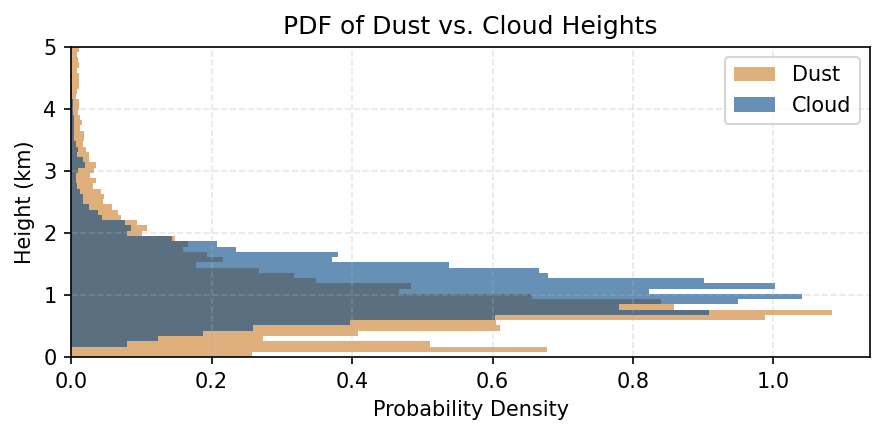

In [6]:
# ===== 数据准备 =====
dust_mean_height  = ds_dust_heights["dust_mean_height"].values
dust_mean_height  = dust_mean_height[np.isfinite(dust_mean_height)]

cloud_mean_height = ds_cloud_heights["cloud_mean_height"].values
cloud_mean_height = cloud_mean_height[np.isfinite(cloud_mean_height)]

bins = np.linspace(0, 5, 60)

# ===== 绘图 =====
fig, ax = plt.subplots(figsize=(6,3), dpi=150)

ax.hist(
    dust_mean_height, bins=bins, density=True, orientation="horizontal",
    alpha=0.6, color="#cb7b25", edgecolor=None, label="Dust"
)
ax.hist(
    cloud_mean_height, bins=bins, density=True, orientation="horizontal",
    alpha=0.6, color="#014686", edgecolor=None, label="Cloud"
)

ax.set_ylabel("Height (km)")
ax.set_xlabel("Probability Density")
ax.set_ylim(0, 5)
ax.set_title("PDF of Dust vs. Cloud Heights")
ax.legend()
ax.grid(alpha=0.3, ls='--')

plt.tight_layout()
plt.show()


## Aerosol-cloud collocation

In [7]:
dust_top_height  = ds_dust_heights["dust_top_height"].values
dust_base_height  = ds_dust_heights["dust_base_height"].values
dust_thickness = ds_dust_heights["dust_layer_thickness"].values
dust_mean_height = ds_dust_heights["dust_mean_height"].values

cloud_top_height  = ds_cloud_heights["cloud_top_height"].values
cloud_base_height  = ds_cloud_heights["cloud_base_height"].values
cloud_thickness = ds_cloud_heights["cloud_geometric_thickness"].values
cloud_mean_height = ds_cloud_heights["cloud_mean_height"].values

### Count the number of times each duration occurs

In [8]:
# 建立 mask: 只在所有都非 NaN 时为 True
valid_mask = (~np.isnan(dust_top_height) &
              ~np.isnan(dust_base_height) &
              ~np.isnan(cloud_top_height) &
              ~np.isnan(cloud_base_height))

# 初始化输出数组（复制一份原始数组）
dust_top_height_new  = dust_top_height.copy()
dust_base_height_new = dust_base_height.copy()
dust_mean_height_new = dust_mean_height.copy()
dust_thickness_new = dust_thickness.copy()

cloud_top_height_new = cloud_top_height.copy()
cloud_base_height_new = cloud_base_height.copy()
cloud_mean_height_new = cloud_mean_height.copy()
cloud_thickness_new = cloud_thickness.copy()

# 把无效位置全部设为 NaN
dust_top_height_new[~valid_mask]  = np.nan
dust_base_height_new[~valid_mask] = np.nan
dust_mean_height_new[~valid_mask]  = np.nan
dust_thickness_new[~valid_mask] = np.nan

cloud_top_height_new[~valid_mask] = np.nan
cloud_base_height_new[~valid_mask] = np.nan
cloud_mean_height_new[~valid_mask] = np.nan
cloud_thickness_new[~valid_mask] = np.nan

In [9]:
import numpy as np

arr = dust_top_height_new  # 你的数组

# 掩膜：True 表示非 NaN
mask = ~np.isnan(arr)

# 找片段边界
diff = np.diff(mask.astype(int))
starts = np.where(diff == 1)[0] + 1
ends   = np.where(diff == -1)[0]

if mask[0]:
    starts = np.r_[0, starts]
if mask[-1]:
    ends = np.r_[ends, len(arr)-1]

# 每个片段的长度
lengths = ends - starts + 1

# 统计
max_len = lengths.max() if len(lengths) > 0 else 0
arr_counts = np.zeros(max_len, dtype=int)

for L in lengths:
    arr_counts[L-1] += 1


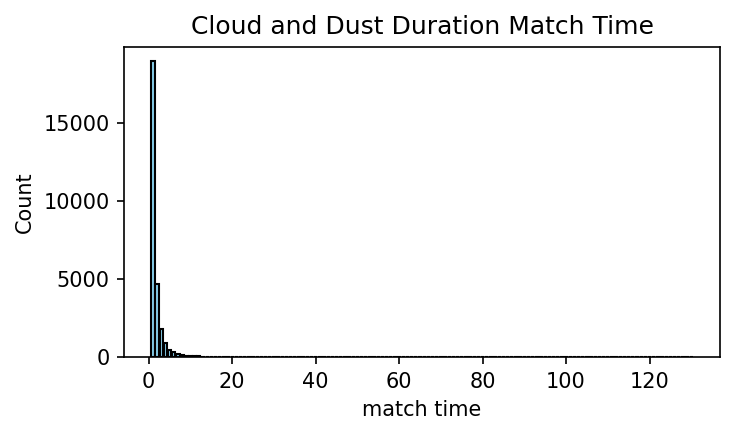

In [10]:
x = np.arange(1, max_len+1)
y = arr_counts

fig, ax = plt.subplots(figsize=(5,3), dpi=150)
ax.bar(x, y, color="skyblue", edgecolor="k")  

ax.set_xlabel("match time")
ax.set_ylabel("Count")
ax.set_title("Cloud and Dust Duration Match Time")

plt.tight_layout()
plt.show()

In [11]:
mask = (~np.isnan(dust_top_height_new) &
        ~np.isnan(dust_base_height_new) &
        ~np.isnan(cloud_top_height_new) &
        ~np.isnan(cloud_base_height_new))

# No Criterion

In [12]:
import numpy as np

# === Step 1: 构建统一掩膜，找到事件 ===
mask = (~np.isnan(dust_top_height_new) &
        ~np.isnan(dust_base_height_new) &
        ~np.isnan(cloud_top_height_new) &
        ~np.isnan(cloud_base_height_new))

# 找连续非NaN的段落
diff = np.diff(mask.astype(int))
starts = np.where(diff == 1)[0] + 1
ends   = np.where(diff == -1)[0]
if mask[0]:
    starts = np.r_[0, starts]
if mask[-1]:
    ends = np.r_[ends, len(mask)-1]

# === Step 2: 定义统计结果 ===
categories = {"top": 0, "bottom": 0, "middle": 0, "decreasing": 0, "increasing": 0}

# === Step 3: 遍历每个事件，取平均值并分类 ===
for s, e in zip(starts, ends):
    # 当前事件的平均高度
    d_top = np.nanmean(dust_top_height_new[s:e+1])
    d_base = np.nanmean(dust_base_height_new[s:e+1])
    c_top = np.nanmean(cloud_top_height_new[s:e+1])
    c_base = np.nanmean(cloud_base_height_new[s:e+1])

    # 规则判断
    if d_base - c_top > 0.1:
        categories["top"] += 1
    elif c_base - d_top > 0.1:
        categories["bottom"] += 1
    elif (c_base - 0.1 < d_base) and (c_top + 0.1 > d_top):
        categories["middle"] += 1
    elif (c_base - 0.1 < d_top < c_top + 0.1) and (d_base < c_base - 0.1):
        categories["decreasing"] += 1
    elif (c_base - 0.1 < d_base < c_top + 0.1) and (d_top > c_top + 0.1):
        categories["increasing"] += 1

# === Step 4: 输出统计结果 ===
print("事件分类统计：")
for k, v in categories.items():
    print(f"{k}: {v}")


事件分类统计：
top: 7507
bottom: 11580
middle: 7561
decreasing: 605
increasing: 640


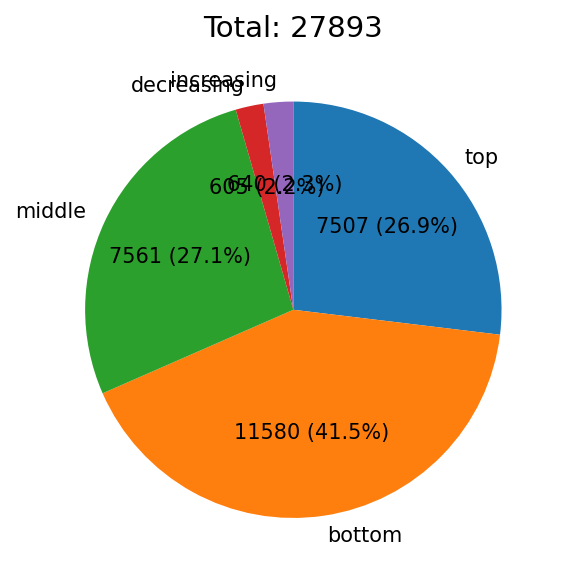

In [13]:
labels = list(categories.keys())
sizes = list(categories.values())
total = sum(sizes)

def make_autopct(sizes):
    def my_autopct(pct):
        count = int(round(pct*total/100.0))
        return f"{count} ({pct:.1f}%)"
    return my_autopct

fig, ax = plt.subplots(figsize=(4,4), dpi=150)
wedges, texts, autotexts = ax.pie(
    sizes,
    labels=labels,
    autopct=make_autopct(sizes),
    startangle=90,
    counterclock=False
)

for text in texts + autotexts:
    text.set_fontsize(10)

ax.set_title(f"Total: {total}", fontsize=14)

plt.tight_layout()
plt.show()



### Violin Plot (mean height and thickness)

In [14]:
import numpy as np

# 类别映射
class_map = {"top": 0, "bottom": 1, "middle": 2, "decreasing": 3, "increasing": 4}
cat_names = list(class_map.keys())

# 初始化标签数组（与原始数据同长度）
labels = np.full(mask.shape, np.nan, dtype=float)
event_counts = {k: 0 for k in class_map.keys()}

# 遍历每个事件段，分类并打标签
for s, e in zip(starts, ends):
    d_top  = np.nanmean(dust_top_height_new[s:e+1])
    d_base = np.nanmean(dust_base_height_new[s:e+1])
    c_top  = np.nanmean(cloud_top_height_new[s:e+1])
    c_base = np.nanmean(cloud_base_height_new[s:e+1])

    cat = None
    if d_base - c_top > 0.1:
        cat = "top"
    elif c_base - d_top > 0.1:
        cat = "bottom"
    elif (c_base - 0.1 < d_base) and (c_top + 0.1 > d_top):
        cat = "middle"
    elif (c_base - 0.1 < d_top < c_top + 0.1) and (d_base < c_base - 0.1):
        cat = "decreasing"
    elif (c_base - 0.1 < d_base < c_top + 0.1) and (d_top > c_top + 0.1):
        cat = "increasing"

    if cat is not None:
        labels[s:e+1] = class_map[cat]
        event_counts[cat] += 1


In [15]:
ds_lwp = xr.open_dataset('/data/ggong/ARM_monthly/ENA/ds_lwp_2min_gap10min_nan.nc')
lwp = ds_lwp.phys_lwp.values

def calc_mean_lwc(lwp, thickness_km):

    lwp = np.asarray(lwp, dtype=float)
    thickness_km = np.asarray(thickness_km, dtype=float)

    thickness_m = thickness_km * 1000.0
    lwc = np.divide(lwp, thickness_m, out=np.full_like(lwp, np.nan), where=thickness_m > 0)
    
    return lwc

lwc = calc_mean_lwc(lwp, cloud_thickness_new)


In [16]:
def extract_event_means(labels, values, target_label):

    event_means = []
    current_event = []

    for lab, val in zip(labels, values):
        if lab == target_label:  # 属于目标类别
            current_event.append(val)
        else:  # 事件结束
            if current_event:  
                event_means.append(np.nanmean(current_event))
                current_event = []
    # 最后收尾
    if current_event:
        event_means.append(np.nanmean(current_event))

    return np.array(event_means)

#---------------------------------------------------------#

cloud_mh_by_cat = {}
dust_mh_by_cat  = {}
cloud_tn_by_cat = {}
dust_tn_by_cat = {}
COD_by_cat  = {}
DOD_by_cat  = {}
lwp_by_cat  = {}
lwc_by_cat  = {}

for name in cat_names:
    
    lab_id = class_map[name]
    
    cloud_mh_by_cat[name] = extract_event_means(labels, cloud_mean_height_new, lab_id)
    dust_mh_by_cat[name]  = extract_event_means(labels, dust_mean_height_new, lab_id)
    cloud_tn_by_cat[name] = extract_event_means(labels, cloud_thickness_new, lab_id)
    dust_tn_by_cat[name]  = extract_event_means(labels, dust_thickness_new, lab_id)
    COD_by_cat[name]      = extract_event_means(labels, COD.values, lab_id)
    DOD_by_cat[name]      = extract_event_means(labels, dust_AOD.values, lab_id)
    lwp_by_cat[name]      = extract_event_means(labels, lwp, lab_id)
    lwc_by_cat[name]      = extract_event_means(labels, lwc, lab_id)

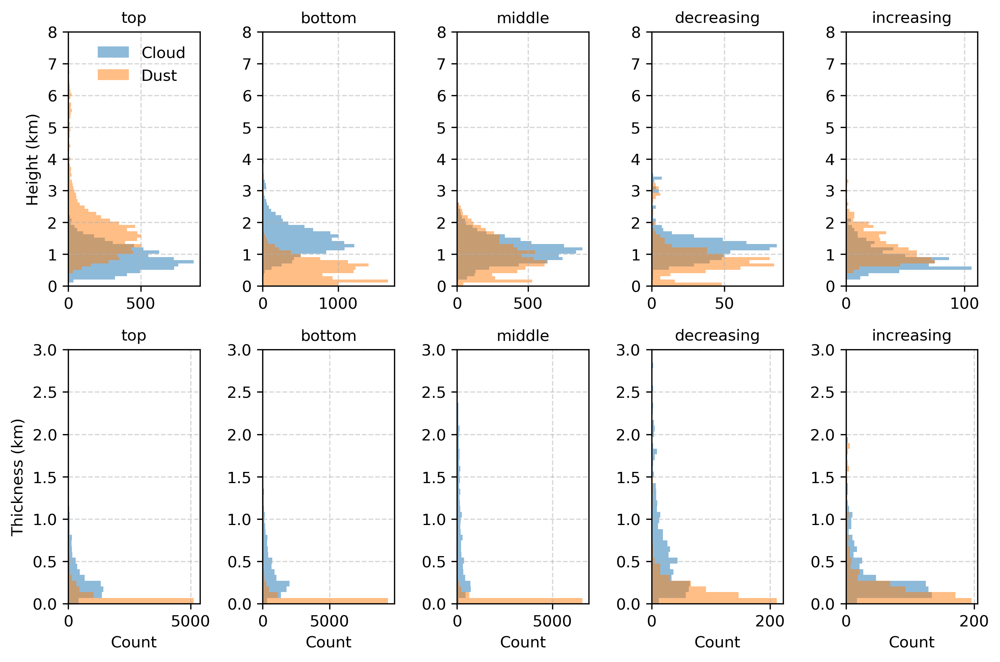

In [17]:
bins_h = np.linspace(0, 8, 80)   # 高度范围 (0-8 km)
bins_t = np.linspace(0, 4, 60)   # 厚度范围 (0-4 km)

fig, axes = plt.subplots(2, 5, figsize=(9, 6), dpi=300, sharex=False, sharey=False)
axes = axes.ravel()

for i, name in enumerate(cat_names[:5]):  # 只画前5个类别作为示例
    ax = axes[i]
    # 平均高度 (Cloud)
    cloud = cloud_mh_by_cat[name]
    cloud_valid = cloud[~np.isnan(cloud)]
    if cloud_valid.size > 0:
        ax.hist(cloud_valid, bins=bins_h, orientation="horizontal",
                color="tab:blue", alpha=0.5, label="Cloud")
    # 平均高度 (Dust)
    dust = dust_mh_by_cat[name]
    dust_valid = dust[~np.isnan(dust)]
    if dust_valid.size > 0:
        ax.hist(dust_valid, bins=bins_h, orientation="horizontal",
                color="tab:orange", alpha=0.5, label="Dust")

    ax.set_title(f"{name}", fontsize=10)
    ax.set_ylim(0, 8)
    ax.grid(ls="--", alpha=0.5)

for i, name in enumerate(cat_names[:5]):  # 下排画厚度
    ax = axes[i+5]
    # 厚度 (Cloud)
    cloud = cloud_tn_by_cat[name]
    cloud_valid = cloud[~np.isnan(cloud)]
    if cloud_valid.size > 0:
        ax.hist(cloud_valid, bins=bins_t, orientation="horizontal",
                color="tab:blue", alpha=0.5, label="Cloud")
    # 厚度 (Dust)
    dust = dust_tn_by_cat[name]
    dust_valid = dust[~np.isnan(dust)]
    if dust_valid.size > 0:
        ax.hist(dust_valid, bins=bins_t, orientation="horizontal",
                color="tab:orange", alpha=0.5, label="Dust")

    ax.set_title(f"{name}", fontsize=10)
    ax.set_ylim(0, 3)
    ax.grid(ls="--", alpha=0.5)

# 标签设置
for ax in axes[5:]:
    ax.set_xlabel("Count")
    
axes[0].set_ylabel("Height (km)")
axes[5].set_ylabel("Thickness (km)")
# 图例放在第一个子图
axes[0].legend(frameon=False, loc="upper right")

plt.tight_layout()
plt.show()


### Dust-Cloud saparation distances

In [18]:
arr_dist_top    = np.full(mask.shape, np.nan)
arr_dist_bottom = np.full(mask.shape, np.nan)

for s, e in zip(starts, ends):
    d_top, d_base = np.nanmean(dust_top_height_new[s:e+1]), np.nanmean(dust_base_height_new[s:e+1])
    c_top, c_base = np.nanmean(cloud_top_height_new[s:e+1]), np.nanmean(cloud_base_height_new[s:e+1])

    if d_base - c_top > 0.1:  # top
        dist = max(0, d_base - c_top - 0.1)
        arr_dist_top[s:e+1] = dist
    elif c_base - d_top > 0.1:  # bottom
        dist = max(0, c_base - d_top - 0.1)
        arr_dist_bottom[s:e+1] = dist

def extract_event_meanss(arr):
    """输入: 带 NaN 的数组; 输出: 每个事件的平均值列表"""
    events = []
    in_event, start = False, None

    for i, v in enumerate(arr):
        if not np.isnan(v) and not in_event:
            # 事件开始
            in_event, start = True, i
        elif np.isnan(v) and in_event:
            # 事件结束
            events.append(np.nanmean(arr[start:i]))
            in_event = False
    # 若最后一个事件到结尾
    if in_event:
        events.append(np.nanmean(arr[start:]))
    return np.array(events)

# 分别计算 top 和 bottom 事件的平均距离
arr_dist_top    = extract_event_meanss(arr_dist_top)
arr_dist_bottom = extract_event_meanss(arr_dist_bottom)

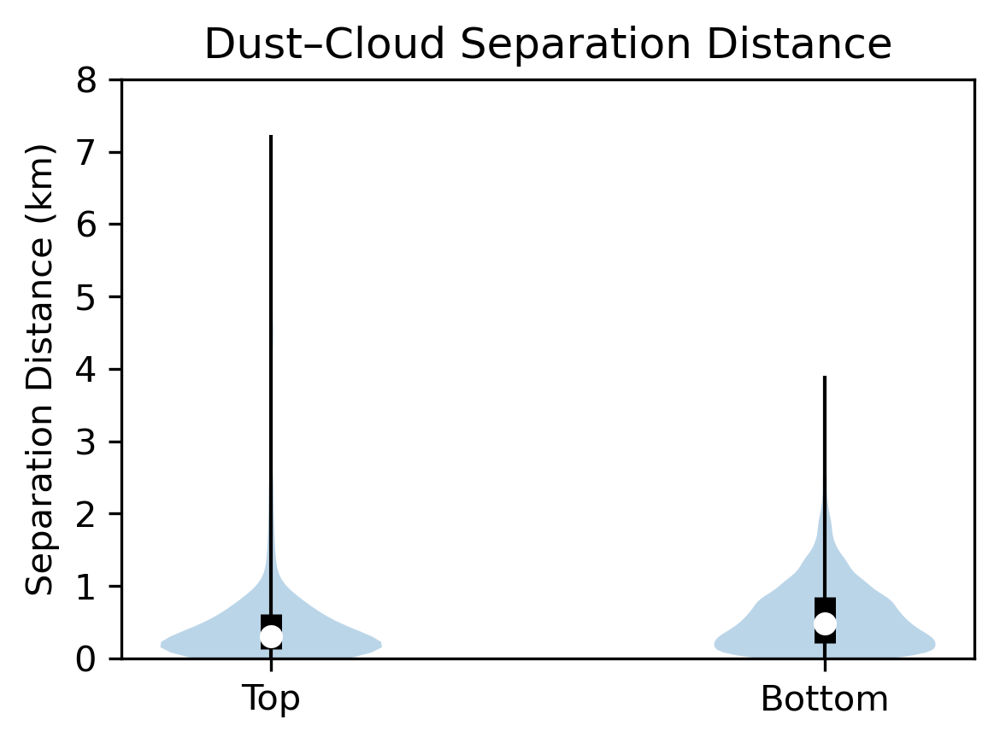

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# 数据
data = [arr_dist_top, arr_dist_bottom]
positions = [1, 2]
fig, ax = plt.subplots(1, 1, figsize=(4, 3), dpi=300)

# 绘制 violin，不显示均值/中位数/极值
parts = ax.violinplot(
    data, positions=positions, widths=0.4,
    showmeans=False, showmedians=False, showextrema=False
)


# 添加中位数、IQR、min–max
for pos, d in zip(positions, data):
    q1, med, q3 = np.percentile(d, [25, 50, 75])
    ax.scatter(pos, med, color="white", s=30, zorder=3)   # 中位数
    ax.vlines(pos, q1, q3, color="black", lw=6)           # IQR
    ax.vlines(pos, d.min(), d.max(), color="black", lw=1) # min–max

# 坐标轴美化
ax.set_xticks(positions)
ax.set_xticklabels(["Top", "Bottom"])
ax.set_ylabel("Separation Distance (km)")
ax.set_title("Dust–Cloud Separation Distance")
ax.set_ylim(0,8)
plt.tight_layout()
plt.show()


### Dust Optical Depth vs. Variables

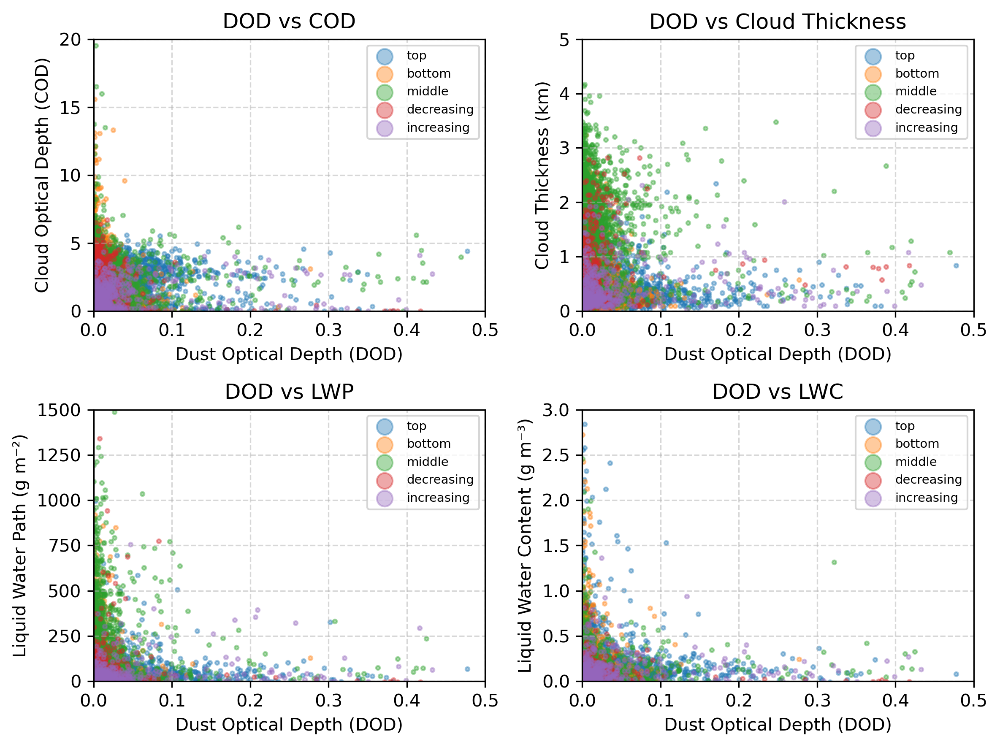

In [20]:
import matplotlib.pyplot as plt
import numpy as np

colors = ["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple"]

fig, axes = plt.subplots(2, 2, figsize=(8, 6), dpi=300)

# 子图列表配置：[(x数据字典, y数据字典, xlabel, ylabel, title, ylim)]
plots = [
    (DOD_by_cat, COD_by_cat, "Dust Optical Depth (DOD)", "Cloud Optical Depth (COD)", "DOD vs COD", (0, 20)),
    (DOD_by_cat, cloud_tn_by_cat, "Dust Optical Depth (DOD)", "Cloud Thickness (km)", "DOD vs Cloud Thickness", (0, 5)),
    (DOD_by_cat, lwp_by_cat, "Dust Optical Depth (DOD)", "Liquid Water Path (g m⁻²)", "DOD vs LWP", (0, 1500)),
    (DOD_by_cat, lwc_by_cat, "Dust Optical Depth (DOD)", "Liquid Water Content (g m⁻³)", "DOD vs LWC", (0, 3)),
]

for ax, (xdict, ydict, xlabel, ylabel, title, ylim) in zip(axes.ravel(), plots):
    for i, name in enumerate(cat_names):
        x, y = xdict[name], ydict[name]
        mask = (~np.isnan(x)) & (~np.isnan(y))
        ax.scatter(x[mask], y[mask], s=5, alpha=0.4, color=colors[i], label=name)
    ax.set(xlabel=xlabel, ylabel=ylabel, title=title, xlim=(0, 0.5), ylim=ylim)
    ax.grid(ls="--", alpha=0.5)
    ax.legend(markerscale=4, fontsize=7)

plt.tight_layout()
plt.show()


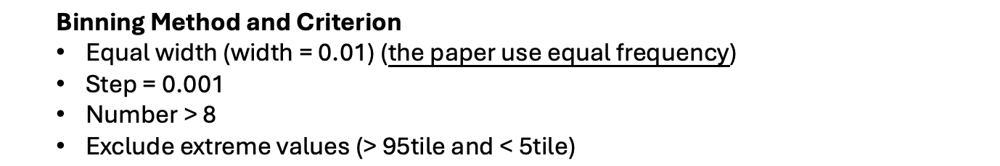

In [21]:
import numpy as np

# ===== 参数 =====
window_width = 0.010   # 滑动窗口宽度（DOD 绝对值尺度，可调）
step          = 0.001   # 滑动步长（越小越丝滑）
min_count_win = 8       # 每个窗口最少样本数
q_low, q_high = 0.10, 0.90

def mask_extremes(a, q_low=0.05, q_high=0.95):
    a = np.asarray(a, dtype=float)
    v = np.isfinite(a)
    if v.sum() == 0:
        return np.full_like(a, np.nan)
    lo, hi = np.nanquantile(a[v], [q_low, q_high])
    out = a.copy()
    out[(a < lo) | (a > hi)] = np.nan
    return out

def moving_window_xy(x, y, xmin, xmax, width, step):
    # 窗口中心序列
    centers = np.arange(xmin + width/2, xmax - width/2 + step/2, step)
    x_mean = np.full_like(centers, np.nan, dtype=float)
    y_mean = np.full_like(centers, np.nan, dtype=float)
    y_sem  = np.full_like(centers, np.nan, dtype=float)
    count  = np.zeros_like(centers, dtype=int)

    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if x.size == 0:
        return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

    half = width / 2.0
    for i, c in enumerate(centers):
        sel = (x >= c - half) & (x < c + half)
        if sel.any():
            xb, yb = x[sel], y[sel]
            count[i]  = xb.size
            x_mean[i] = xb.mean()
            y_mean[i] = yb.mean()
            if xb.size > 1:
                y_sem[i] = yb.std(ddof=1) / np.sqrt(xb.size)

    return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

# ===== 1) 去极值 + 三变量交集，收集全局范围 =====
trip = {}
all_DOD = []
for name in cat_names:
    x0 = mask_extremes(DOD_by_cat[name], q_low, q_high)
    y0 = mask_extremes(COD_by_cat[name], q_low, q_high)
    z0 = mask_extremes(cloud_tn_by_cat[name], q_low, q_high)
    m = np.isfinite(x0) & np.isfinite(y0) & np.isfinite(z0)
    x, y, z = x0[m], y0[m], z0[m]
    trip[name] = {"x": x, "y": y, "z": z}
    all_DOD.append(x)
all_DOD = np.concatenate(all_DOD) if all_DOD else np.array([])

xmin, xmax = np.nanmin(all_DOD), np.nanmax(all_DOD)
if np.isclose(xmin, xmax):
    xmin, xmax = xmin - 1e-9, xmax + 1e-9

# ===== 2) 滑动窗口统计 =====
results_cod_mov = {}
results_tn_mov  = {}
for name in cat_names:
    x = trip[name]["x"]; y = trip[name]["y"]; z = trip[name]["z"]
    results_cod_mov[name] = moving_window_xy(x, y, xmin, xmax, window_width, step)
    results_tn_mov[name]  = moving_window_xy(x, z, xmin, xmax, window_width, step)

binning_meta_mov = {
    "window_width": window_width,
    "step": step,
    "min_count": min_count_win,
}

In [22]:
# ===== 2') 为 LWP / LWC 做同样的滑窗统计（与 DOD 成对） =====
results_lwp_mov = {}
results_lwc_mov = {}

for name in cat_names:
    # 去极值
    x0   = mask_extremes(DOD_by_cat[name], q_low, q_high)
    lwp0 = mask_extremes(lwp_by_cat[name], q_low, q_high)
    lwc0 = mask_extremes(lwc_by_cat[name], q_low, q_high)

    # 与 DOD 的有效交集（分别与 LWP / LWC 成对）
    m_lwp = np.isfinite(x0) & np.isfinite(lwp0)
    m_lwc = np.isfinite(x0) & np.isfinite(lwc0)

    x_lwp, y_lwp = x0[m_lwp], lwp0[m_lwp]
    x_lwc, y_lwc = x0[m_lwc], lwc0[m_lwc]

    # 滑窗
    r_lwp = moving_window_xy(x_lwp, y_lwp, xmin, xmax, window_width, step)
    r_lwc = moving_window_xy(x_lwc, y_lwc, xmin, xmax, window_width, step)

    # 可选：按最小样本数阈值屏蔽
    bad = r_lwp["count"] < min_count_win
    r_lwp["x_mean"][bad] = np.nan; r_lwp["y_mean"][bad] = np.nan; r_lwp["y_sem"][bad] = np.nan
    bad = r_lwc["count"] < min_count_win
    r_lwc["x_mean"][bad] = np.nan; r_lwc["y_mean"][bad] = np.nan; r_lwc["y_sem"][bad] = np.nan

    results_lwp_mov[name] = r_lwp
    results_lwc_mov[name] = r_lwc

# 记录元数据
binning_meta_mov.update({"vars_added": ["LWP", "LWC"]})


In [23]:
def plot_moving(ax, results, ylabel, title, colors, cat_names, meta, show_legend=True):
    min_n = meta["min_count"]
    for i, name in enumerate(cat_names):
        res = results[name]
        x, y, yerr, n = res["x_mean"], res["y_mean"], res["y_sem"], res["count"]
        m = (n >= min_n) & np.isfinite(x) & np.isfinite(y)
        if not m.any():
            continue
        ax.plot(x[m], y[m], '-', lw=1.6, color=colors[i], alpha=0.95, label=name)
        # 误差阴影可选
        # if np.isfinite(yerr[m]).any():
        #     ax.fill_between(x[m], y[m]-yerr[m], y[m]+yerr[m], alpha=0.15, color=colors[i])

    ax.set(xlabel="Dust Optical Depth", ylabel=ylabel, title=title)
    ax.grid(ls="--", alpha=0.5)
    if show_legend:
        ax.legend(fontsize=8)


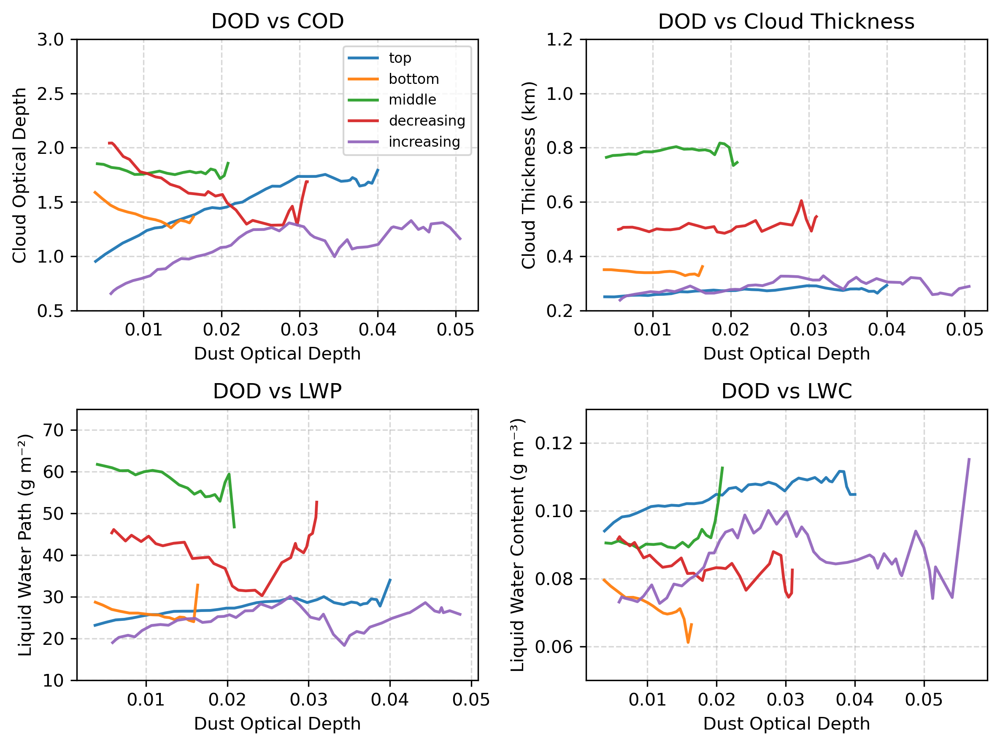

In [24]:
# ==== 画图 ====
fig, axes = plt.subplots(2, 2, figsize=(8,6), dpi=300)

plot_moving(axes[0,0], results_cod_mov, "Cloud Optical Depth",
            "DOD vs COD", colors, cat_names, binning_meta_mov, show_legend=True)
axes[0,0].set_ylim(0.5, 3)

plot_moving(axes[0,1], results_tn_mov, "Cloud Thickness (km)",
            "DOD vs Cloud Thickness", colors, cat_names, binning_meta_mov, show_legend=False)
axes[0,1].set_ylim(0.2, 1.2)

plot_moving(axes[1,0], results_lwp_mov, "Liquid Water Path (g m⁻²)",
            "DOD vs LWP", colors, cat_names, binning_meta_mov, show_legend=False)
axes[1,0].set_ylim(10, 75)

plot_moving(axes[1,1], results_lwc_mov, "Liquid Water Content (g m⁻³)",
            "DOD vs LWC", colors, cat_names, binning_meta_mov, show_legend=False)
axes[1,1].set_ylim(0.05, 0.13)

plt.tight_layout()
plt.show()



## 4 min duration of cloud

In [25]:
import numpy as np

# === Step 1: 构建统一掩膜，找到事件 ===
mask = (~np.isnan(dust_top_height_new) &
        ~np.isnan(dust_base_height_new) &
        ~np.isnan(cloud_top_height_new) &
        ~np.isnan(cloud_base_height_new))

# 找连续非NaN的段落
diff = np.diff(mask.astype(int))
starts = np.where(diff == 1)[0] + 1
ends   = np.where(diff == -1)[0]
if mask[0]:
    starts = np.r_[0, starts]
if mask[-1]:
    ends = np.r_[ends, len(mask)-1]

# === Step 2: 定义统计结果 ===
categories = {"top": 0, "bottom": 0, "middle": 0, "decreasing": 0, "increasing": 0}

# === Step 3: 遍历每个事件，取平均值并分类 ===
for s, e in zip(starts, ends):
    # 加入长度限制：连续非NaN必须 ≥3
    if e - s + 1 < 3:
        continue

    # 当前事件的平均高度
    d_top = np.nanmean(dust_top_height_new[s:e+1])
    d_base = np.nanmean(dust_base_height_new[s:e+1])
    c_top = np.nanmean(cloud_top_height_new[s:e+1])
    c_base = np.nanmean(cloud_base_height_new[s:e+1])

    # 规则判断
    if d_base - c_top > 0.1:
        categories["top"] += 1
    elif c_base - d_top > 0.1:
        categories["bottom"] += 1
    elif (c_base - 0.1 < d_base) and (c_top + 0.1 > d_top):
        categories["middle"] += 1
    elif (c_base - 0.1 < d_top < c_top + 0.1) and (d_base < c_base - 0.1):
        categories["decreasing"] += 1
    elif (c_base - 0.1 < d_base < c_top + 0.1) and (d_top > c_top + 0.1):
        categories["increasing"] += 1

# === Step 4: 输出统计结果 ===
print("事件分类统计：")
for k, v in categories.items():
    print(f"{k}: {v}")


事件分类统计：
top: 825
bottom: 1949
middle: 1174
decreasing: 203
increasing: 109


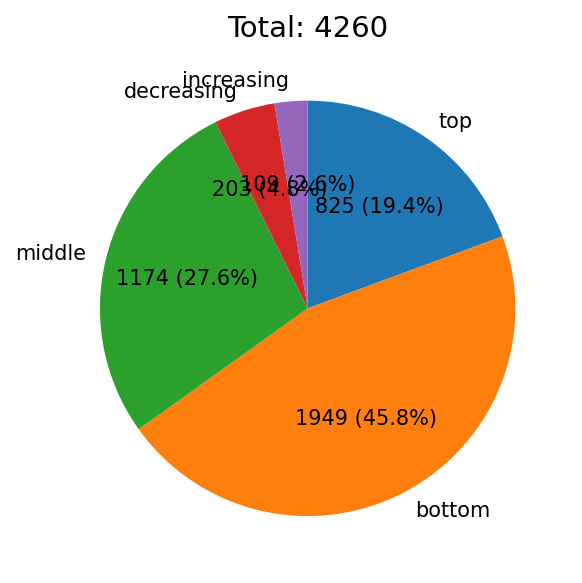

In [26]:
labels = list(categories.keys())
sizes = list(categories.values())
total = sum(sizes)

def make_autopct(sizes):
    def my_autopct(pct):
        count = int(round(pct*total/100.0))
        return f"{count} ({pct:.1f}%)"
    return my_autopct

fig, ax = plt.subplots(figsize=(4,4), dpi=150)
wedges, texts, autotexts = ax.pie(
    sizes,
    labels=labels,
    autopct=make_autopct(sizes),
    startangle=90,
    counterclock=False
)

for text in texts + autotexts:
    text.set_fontsize(10)

ax.set_title(f"Total: {total}", fontsize=14)

plt.tight_layout()
plt.show()


In [27]:
import numpy as np

# 类别映射
class_map = {"top": 0, "bottom": 1, "middle": 2, "decreasing": 3, "increasing": 4}
cat_names = list(class_map.keys())

# 初始化标签数组（与原始数据同长度）
labels = np.full(mask.shape, np.nan, dtype=float)
event_counts = {k: 0 for k in class_map.keys()}

# 遍历每个事件段，分类并打标签
for s, e in zip(starts, ends):
    # 限制条件：连续非NaN点必须 ≥3
    if e - s + 1 < 3:
        continue

    d_top  = np.nanmean(dust_top_height_new[s:e+1])
    d_base = np.nanmean(dust_base_height_new[s:e+1])
    c_top  = np.nanmean(cloud_top_height_new[s:e+1])
    c_base = np.nanmean(cloud_base_height_new[s:e+1])

    cat = None
    if d_base - c_top > 0.1:
        cat = "top"
    elif c_base - d_top > 0.1:
        cat = "bottom"
    elif (c_base - 0.1 < d_base) and (c_top + 0.1 > d_top):
        cat = "middle"
    elif (c_base - 0.1 < d_top < c_top + 0.1) and (d_base < c_base - 0.1):
        cat = "decreasing"
    elif (c_base - 0.1 < d_base < c_top + 0.1) and (d_top > c_top + 0.1):
        cat = "increasing"

    if cat is not None:
        labels[s:e+1] = class_map[cat]
        event_counts[cat] += 1


In [28]:
def extract_event_means(labels, values, target_label):

    event_means = []
    current_event = []

    for lab, val in zip(labels, values):
        if lab == target_label:  # 属于目标类别
            current_event.append(val)
        else:  # 事件结束
            if current_event:  
                event_means.append(np.nanmean(current_event))
                current_event = []
    # 最后收尾
    if current_event:
        event_means.append(np.nanmean(current_event))

    return np.array(event_means)

#---------------------------------------------------------#

cloud_mh_by_cat = {}
dust_mh_by_cat  = {}
cloud_tn_by_cat = {}
dust_tn_by_cat = {}
COD_by_cat  = {}
DOD_by_cat  = {}
lwp_by_cat  = {}
lwc_by_cat  = {}

for name in cat_names:
    
    lab_id = class_map[name]
    
    cloud_mh_by_cat[name] = extract_event_means(labels, cloud_mean_height_new, lab_id)
    dust_mh_by_cat[name]  = extract_event_means(labels, dust_mean_height_new, lab_id)
    cloud_tn_by_cat[name] = extract_event_means(labels, cloud_thickness_new, lab_id)
    dust_tn_by_cat[name]  = extract_event_means(labels, dust_thickness_new, lab_id)
    COD_by_cat[name]      = extract_event_means(labels, COD.values, lab_id)
    DOD_by_cat[name]      = extract_event_means(labels, dust_AOD.values, lab_id)
    lwp_by_cat[name]      = extract_event_means(labels, lwp, lab_id)
    lwc_by_cat[name]      = extract_event_means(labels, lwc, lab_id)

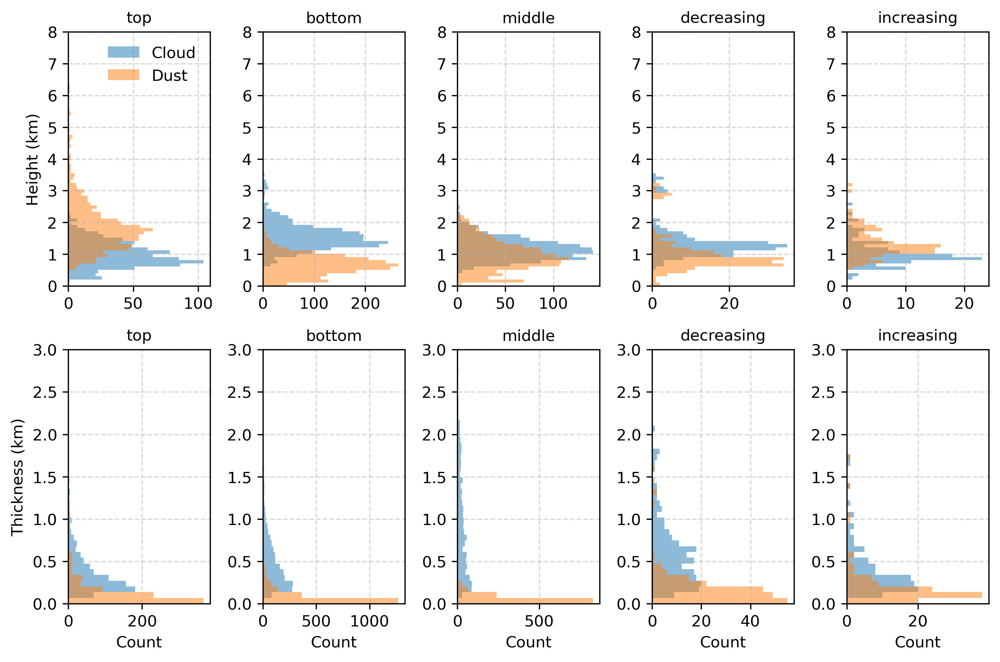

In [29]:
import numpy as np

bins_h = np.linspace(0, 8, 80)   # 高度范围 (0-8 km)
bins_t = np.linspace(0, 4, 60)   # 厚度范围 (0-4 km)

fig, axes = plt.subplots(2, 5, figsize=(9, 6), dpi=300, sharex=False, sharey=False)
axes = axes.ravel()

for i, name in enumerate(cat_names[:5]):  # 只画前5个类别作为示例
    ax = axes[i]
    # 平均高度 (Cloud)
    cloud = cloud_mh_by_cat[name]
    cloud_valid = cloud[~np.isnan(cloud)]
    if cloud_valid.size > 0:
        ax.hist(cloud_valid, bins=bins_h, orientation="horizontal",
                color="tab:blue", alpha=0.5, label="Cloud")
    # 平均高度 (Dust)
    dust = dust_mh_by_cat[name]
    dust_valid = dust[~np.isnan(dust)]
    if dust_valid.size > 0:
        ax.hist(dust_valid, bins=bins_h, orientation="horizontal",
                color="tab:orange", alpha=0.5, label="Dust")

    ax.set_title(f"{name}", fontsize=10)
    ax.set_ylim(0, 8)
    ax.grid(ls="--", alpha=0.5)

for i, name in enumerate(cat_names[:5]):  # 下排画厚度
    ax = axes[i+5]
    # 厚度 (Cloud)
    cloud = cloud_tn_by_cat[name]
    cloud_valid = cloud[~np.isnan(cloud)]
    if cloud_valid.size > 0:
        ax.hist(cloud_valid, bins=bins_t, orientation="horizontal",
                color="tab:blue", alpha=0.5, label="Cloud")
    # 厚度 (Dust)
    dust = dust_tn_by_cat[name]
    dust_valid = dust[~np.isnan(dust)]
    if dust_valid.size > 0:
        ax.hist(dust_valid, bins=bins_t, orientation="horizontal",
                color="tab:orange", alpha=0.5, label="Dust")

    ax.set_title(f"{name}", fontsize=10)
    ax.set_ylim(0, 3)
    ax.grid(ls="--", alpha=0.5)

# 标签设置
for ax in axes[5:]:
    ax.set_xlabel("Count")
    
axes[0].set_ylabel("Height (km)")
axes[5].set_ylabel("Thickness (km)")
# 图例放在第一个子图
axes[0].legend(frameon=False, loc="upper right")

plt.tight_layout()
plt.show()

In [30]:
arr_dist_top    = np.full(mask.shape, np.nan)
arr_dist_bottom = np.full(mask.shape, np.nan)

for s, e in zip(starts, ends):
    d_top, d_base = np.nanmean(dust_top_height_new[s:e+1]), np.nanmean(dust_base_height_new[s:e+1])
    c_top, c_base = np.nanmean(cloud_top_height_new[s:e+1]), np.nanmean(cloud_base_height_new[s:e+1])

    if d_base - c_top > 0.1:  # top
        dist = max(0, d_base - c_top - 0.1)
        arr_dist_top[s:e+1] = dist
    elif c_base - d_top > 0.1:  # bottom
        dist = max(0, c_base - d_top - 0.1)
        arr_dist_bottom[s:e+1] = dist

def extract_event_meanss(arr):
    """输入: 带 NaN 的数组; 输出: 每个事件的平均值列表"""
    events = []
    in_event, start = False, None

    for i, v in enumerate(arr):
        if not np.isnan(v) and not in_event:
            # 事件开始
            in_event, start = True, i
        elif np.isnan(v) and in_event:
            # 事件结束
            events.append(np.nanmean(arr[start:i]))
            in_event = False
    # 若最后一个事件到结尾
    if in_event:
        events.append(np.nanmean(arr[start:]))
    return np.array(events)

# 分别计算 top 和 bottom 事件的平均距离
arr_dist_top    = extract_event_meanss(arr_dist_top)
arr_dist_bottom = extract_event_meanss(arr_dist_bottom)

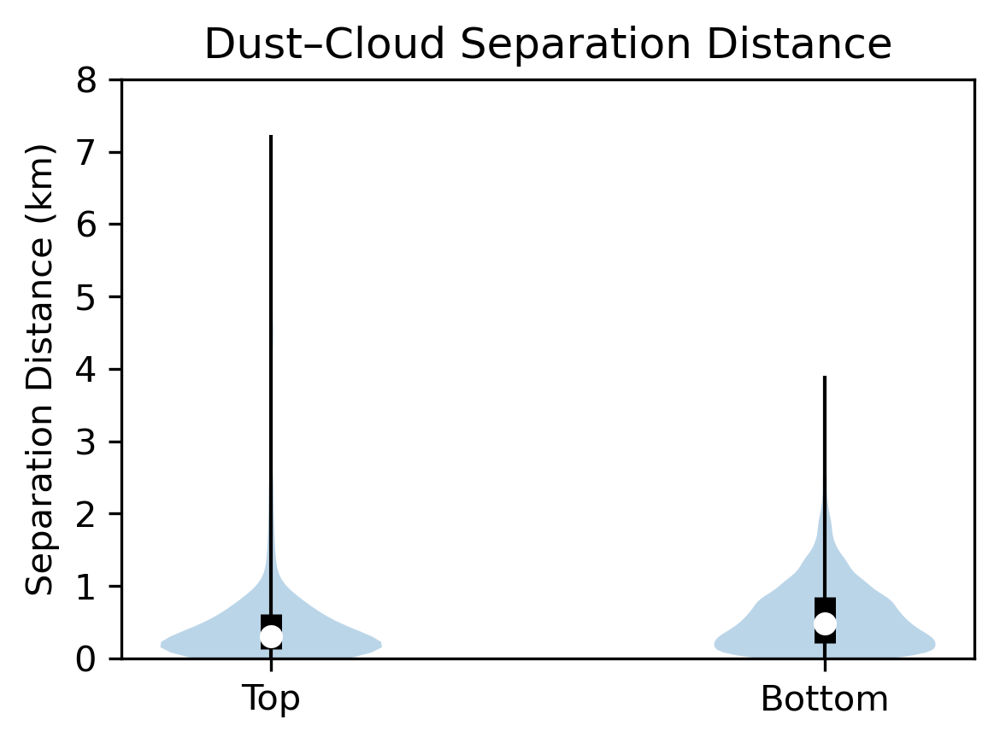

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# 数据
data = [arr_dist_top, arr_dist_bottom]
positions = [1, 2]
fig, ax = plt.subplots(1, 1, figsize=(4, 3), dpi=300)

# 绘制 violin，不显示均值/中位数/极值
parts = ax.violinplot(
    data, positions=positions, widths=0.4,
    showmeans=False, showmedians=False, showextrema=False
)


# 添加中位数、IQR、min–max
for pos, d in zip(positions, data):
    q1, med, q3 = np.percentile(d, [25, 50, 75])
    ax.scatter(pos, med, color="white", s=30, zorder=3)   # 中位数
    ax.vlines(pos, q1, q3, color="black", lw=6)           # IQR
    ax.vlines(pos, d.min(), d.max(), color="black", lw=1) # min–max

# 坐标轴美化
ax.set_xticks(positions)
ax.set_xticklabels(["Top", "Bottom"])
ax.set_ylabel("Separation Distance (km)")
ax.set_title("Dust–Cloud Separation Distance")
ax.set_ylim(0,8)
plt.tight_layout()
plt.show()


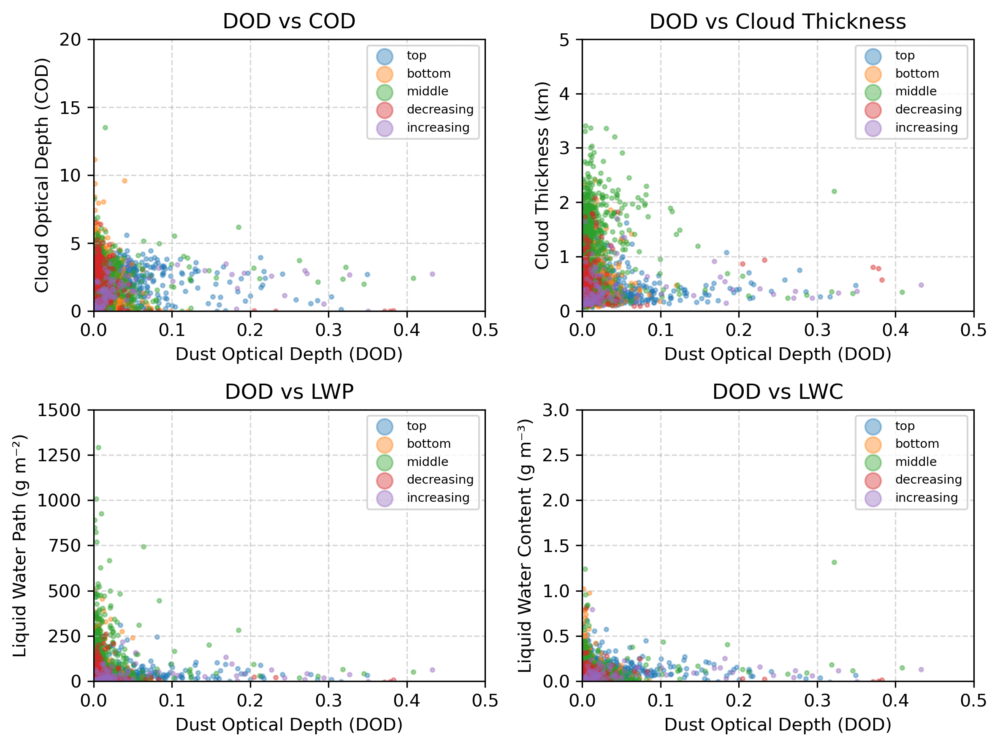

In [32]:
import matplotlib.pyplot as plt
import numpy as np

colors = ["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple"]

fig, axes = plt.subplots(2, 2, figsize=(8, 6), dpi=300)

# 子图列表配置：[(x数据字典, y数据字典, xlabel, ylabel, title, ylim)]
plots = [
    (DOD_by_cat, COD_by_cat, "Dust Optical Depth (DOD)", "Cloud Optical Depth (COD)", "DOD vs COD", (0, 20)),
    (DOD_by_cat, cloud_tn_by_cat, "Dust Optical Depth (DOD)", "Cloud Thickness (km)", "DOD vs Cloud Thickness", (0, 5)),
    (DOD_by_cat, lwp_by_cat, "Dust Optical Depth (DOD)", "Liquid Water Path (g m⁻²)", "DOD vs LWP", (0, 1500)),
    (DOD_by_cat, lwc_by_cat, "Dust Optical Depth (DOD)", "Liquid Water Content (g m⁻³)", "DOD vs LWC", (0, 3)),
]

for ax, (xdict, ydict, xlabel, ylabel, title, ylim) in zip(axes.ravel(), plots):
    for i, name in enumerate(cat_names):
        x, y = xdict[name], ydict[name]
        mask = (~np.isnan(x)) & (~np.isnan(y))
        ax.scatter(x[mask], y[mask], s=5, alpha=0.4, color=colors[i], label=name)
    ax.set(xlabel=xlabel, ylabel=ylabel, title=title, xlim=(0, 0.5), ylim=ylim)
    ax.grid(ls="--", alpha=0.5)
    ax.legend(markerscale=4, fontsize=7)

plt.tight_layout()
plt.show()

In [33]:
# ===== 参数 =====
window_width = 0.010   # 滑动窗口宽度（DOD 绝对值尺度，可调）
step          = 0.001   # 滑动步长（越小越丝滑）
min_count_win = 8       # 每个窗口最少样本数
q_low, q_high = 0.10, 0.90

def mask_extremes(a, q_low=0.05, q_high=0.95):
    a = np.asarray(a, dtype=float)
    v = np.isfinite(a)
    if v.sum() == 0:
        return np.full_like(a, np.nan)
    lo, hi = np.nanquantile(a[v], [q_low, q_high])
    out = a.copy()
    out[(a < lo) | (a > hi)] = np.nan
    return out

def moving_window_xy(x, y, xmin, xmax, width, step):
    # 窗口中心序列
    centers = np.arange(xmin + width/2, xmax - width/2 + step/2, step)
    x_mean = np.full_like(centers, np.nan, dtype=float)
    y_mean = np.full_like(centers, np.nan, dtype=float)
    y_sem  = np.full_like(centers, np.nan, dtype=float)
    count  = np.zeros_like(centers, dtype=int)

    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if x.size == 0:
        return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

    half = width / 2.0
    for i, c in enumerate(centers):
        sel = (x >= c - half) & (x < c + half)
        if sel.any():
            xb, yb = x[sel], y[sel]
            count[i]  = xb.size
            x_mean[i] = xb.mean()
            y_mean[i] = yb.mean()
            if xb.size > 1:
                y_sem[i] = yb.std(ddof=1) / np.sqrt(xb.size)

    return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

# ===== 1) 去极值 + 三变量交集，收集全局范围 =====
trip = {}
all_DOD = []
for name in cat_names:
    x0 = mask_extremes(DOD_by_cat[name], q_low, q_high)
    y0 = mask_extremes(COD_by_cat[name], q_low, q_high)
    z0 = mask_extremes(cloud_tn_by_cat[name], q_low, q_high)
    m = np.isfinite(x0) & np.isfinite(y0) & np.isfinite(z0)
    x, y, z = x0[m], y0[m], z0[m]
    trip[name] = {"x": x, "y": y, "z": z}
    all_DOD.append(x)
all_DOD = np.concatenate(all_DOD) if all_DOD else np.array([])

xmin, xmax = np.nanmin(all_DOD), np.nanmax(all_DOD)
if np.isclose(xmin, xmax):
    xmin, xmax = xmin - 1e-9, xmax + 1e-9

# ===== 2) 滑动窗口统计 =====
results_cod_mov = {}
results_tn_mov  = {}
for name in cat_names:
    x = trip[name]["x"]; y = trip[name]["y"]; z = trip[name]["z"]
    results_cod_mov[name] = moving_window_xy(x, y, xmin, xmax, window_width, step)
    results_tn_mov[name]  = moving_window_xy(x, z, xmin, xmax, window_width, step)

binning_meta_mov = {
    "window_width": window_width,
    "step": step,
    "min_count": min_count_win,
}

In [34]:
# ===== 2') 为 LWP / LWC 做同样的滑窗统计（与 DOD 成对） =====
results_lwp_mov = {}
results_lwc_mov = {}

for name in cat_names:
    # 去极值
    x0   = mask_extremes(DOD_by_cat[name], q_low, q_high)
    lwp0 = mask_extremes(lwp_by_cat[name], q_low, q_high)
    lwc0 = mask_extremes(lwc_by_cat[name], q_low, q_high)

    # 与 DOD 的有效交集（分别与 LWP / LWC 成对）
    m_lwp = np.isfinite(x0) & np.isfinite(lwp0)
    m_lwc = np.isfinite(x0) & np.isfinite(lwc0)

    x_lwp, y_lwp = x0[m_lwp], lwp0[m_lwp]
    x_lwc, y_lwc = x0[m_lwc], lwc0[m_lwc]

    # 滑窗
    r_lwp = moving_window_xy(x_lwp, y_lwp, xmin, xmax, window_width, step)
    r_lwc = moving_window_xy(x_lwc, y_lwc, xmin, xmax, window_width, step)

    # 可选：按最小样本数阈值屏蔽
    bad = r_lwp["count"] < min_count_win
    r_lwp["x_mean"][bad] = np.nan; r_lwp["y_mean"][bad] = np.nan; r_lwp["y_sem"][bad] = np.nan
    bad = r_lwc["count"] < min_count_win
    r_lwc["x_mean"][bad] = np.nan; r_lwc["y_mean"][bad] = np.nan; r_lwc["y_sem"][bad] = np.nan

    results_lwp_mov[name] = r_lwp
    results_lwc_mov[name] = r_lwc

# 记录元数据
binning_meta_mov.update({"vars_added": ["LWP", "LWC"]})


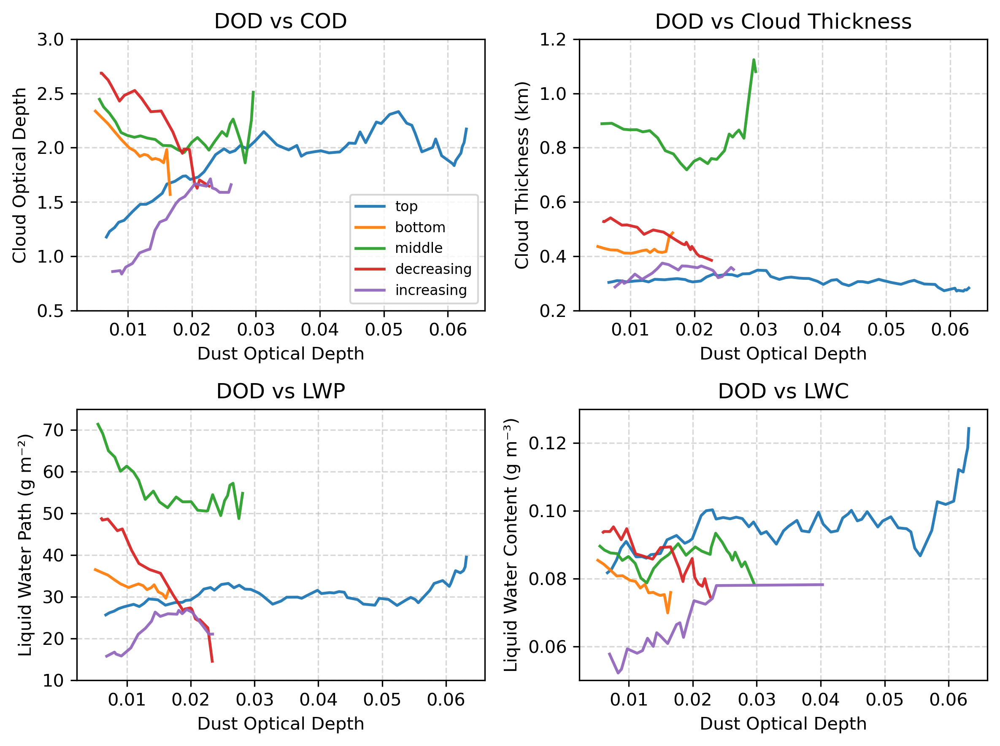

In [35]:
# ==== 画图 ====
fig, axes = plt.subplots(2, 2, figsize=(8,6), dpi=300)

plot_moving(axes[0,0], results_cod_mov, "Cloud Optical Depth",
            "DOD vs COD", colors, cat_names, binning_meta_mov, show_legend=True)
axes[0,0].set_ylim(0.5, 3)

plot_moving(axes[0,1], results_tn_mov, "Cloud Thickness (km)",
            "DOD vs Cloud Thickness", colors, cat_names, binning_meta_mov, show_legend=False)
axes[0,1].set_ylim(0.2, 1.2)

plot_moving(axes[1,0], results_lwp_mov, "Liquid Water Path (g m⁻²)",
            "DOD vs LWP", colors, cat_names, binning_meta_mov, show_legend=False)
axes[1,0].set_ylim(10, 75)

plot_moving(axes[1,1], results_lwc_mov, "Liquid Water Content (g m⁻³)",
            "DOD vs LWC", colors, cat_names, binning_meta_mov, show_legend=False)
axes[1,1].set_ylim(0.05, 0.13)

plt.tight_layout()
plt.show()

## monthly and diurnal trend of DOD

### Whole data, no classfication

In [36]:
# ====== A. 数据处理 ======
import numpy as np
import pandas as pd
import xarray as xr

# --- 0) 基础：参数/颜色与层定义 ---
order = [
    ("dust_AOD_0_200m",    "0-200 m",    "#e41a1c"),
    ("dust_AOD_200_400m",  "200-400 m",  "#4daf4a"),
    ("dust_AOD_400_600m",  "400-600 m",  "#377eb8"),
    ("dust_AOD_600_800m",  "600-800 m",  "#984ea3"),
    ("dust_AOD_800_1200m", "800-1200 m", "#6a3d9a"),
    ("dust_AOD_gt_1200m",  ">1200 m",    "#ff7f00"),
]
layers_km = [(0.00,0.20),(0.20,0.40),(0.40,0.60),(0.60,0.80),(0.80,1.20),(1.20,999.0)]
layer_names = [x[0] for x in order]

# --- 1) QC：去掉 >1 的点（对 Dask 友好）---
mask_valid = ext_dust.where(ext_dust <= 1)
pre_valid  = int(ext_dust.count().compute())
post_valid = int(mask_valid.count().compute())
n_filtered = pre_valid - post_valid
filtered_ratio = 100.0 * n_filtered / pre_valid if pre_valid > 0 else np.nan
print(f"[QC] 滤掉的数据: {n_filtered} / {pre_valid} ({filtered_ratio:.4f}%)")

ext_dust = mask_valid  # 替换为过滤后的版本

# --- 2) 按高度层积分（得到各层 DOD=分层AOD；沿 height_high 对 ext_dust*dz 积分）---
h_km = ds_a["height_high"]              # (km)
dzA  = (ext_dust * dz2d)                # 与 ext_dust 对齐的 Δz 权重

layer_results = {}
for (lo, hi), name in zip(layers_km, layer_names):
    mask_layer = (h_km >= lo) if hi >= 900 else ((h_km >= lo) & (h_km < hi))
    layer_results[name] = dzA.where(mask_layer).sum("height_high")

dust_AOD_layers = xr.Dataset(layer_results)  # (time,)

# 可选一致性检查：与整柱 AOD 比较
# dust_AOD_check = dust_AOD_layers.to_array("layer").sum("layer")

# --- 3) 季节平均的 extinction 剖面（曲线用）---
da_season = ext_dust.groupby("time.season").mean("time", skipna=True)
season_order = ["MAM", "JJA", "SON", "DJF"]
da_season = da_season.sel(season=season_order)

# --- 4) 简易本地时 (ENA 冬季近似：UTC-1h；若要精确 DST/LST，用你之前的函数) ---
dust_AOD_layers_local = dust_AOD_layers.assign_coords(
    time=dust_AOD_layers.indexes["time"] - pd.to_timedelta(1, "h")
)
ext_dust_local = ext_dust.assign_coords(
    time=ext_dust.indexes["time"] - pd.to_timedelta(1, "h")
)

# --- 5) 逐小时统计（画日变化堆叠 & 两条总线，以及 02/08/24h 剖面）---
# 各层逐时均值（0..23）
layer_hour_means = []
for var, _, _ in order:
    hmean = dust_AOD_layers_local[var].groupby("time.hour").mean("time", skipna=True)
    layer_hour_means.append(hmean.sel(hour=np.arange(24)).values)  # (24,)

# <800m 与 ≥800m 的逐时均值
low_hour  = sum(dust_AOD_layers_local[v].groupby("time.hour").mean("time", skipna=True)
                for v,_,_ in order[:4]).sel(hour=np.arange(24))
high_hour = sum(dust_AOD_layers_local[v].groupby("time.hour").mean("time", skipna=True)
                for v,_,_ in order[4:]).sel(hour=np.arange(24))

# 02/08/24h extinction 剖面
ext_hourly = ext_dust_local.groupby("time.hour").mean("time", skipna=True)  # (hour, height_high)
ext_mean   = ext_dust_local.mean("time", skipna=True)                       # (height_high,)

# --- 6) 逐月层平均（用于月循环子图；若不需要可跳过）---
def monthly_mean_sem(da):
    g   = da.groupby("time.month")
    mu  = g.mean("time", skipna=True)
    sd  = g.std("time",  skipna=True)
    n   = g.count("time")
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu, sem

low_series  = sum(dust_AOD_layers[v] for v,_,_ in order[:4])
high_series = sum(dust_AOD_layers[v] for v,_,_ in order[4:])
low_mean,  low_sem  = monthly_mean_sem(low_series)
high_mean, high_sem = monthly_mean_sem(high_series)

layer_month_means = []
for var, _, _ in order:
    m, _ = monthly_mean_sem(dust_AOD_layers[var])
    layer_month_means.append(m.values)  # 每层的 12 个月均值


[QC] 滤掉的数据: 2326 / 1927275 (0.1207%)


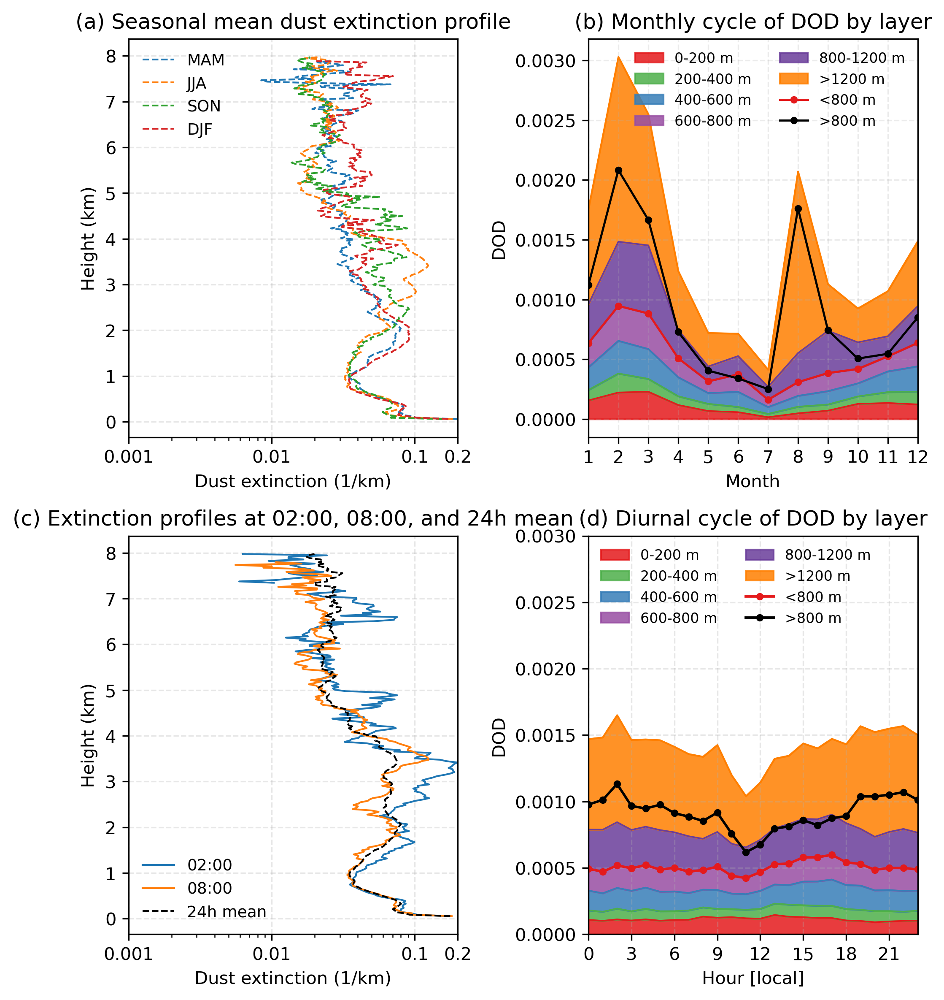

In [37]:
# ====== B. 绘图（2×2 子图）======
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

# 依赖：需已准备好这些变量：
# da_season, layer_hour_means, low_hour, high_hour,
# ext_hourly, ext_mean, layer_month_means, low_mean, high_mean, order

hours  = np.arange(24)
months = np.arange(1, 13)

fig, axes = plt.subplots(2, 2, figsize=(7, 8), dpi=300)
(ax11, ax12), (ax21, ax22) = axes

# ---------- (1,1) 季节平均 extinction 剖面（log-x） ----------
season_colors = {"MAM":"#1f77b4","JJA":"#ff7f0e","SON":"#2ca02c","DJF":"#d62728"}
for s in ["MAM","JJA","SON","DJF"]:
    y = da_season.sel(season=s)
    ax11.plot(y.values, da_season["height_high"].values, lw=1, ls="--",
              color=season_colors[s], label=s)

ax11.set_xscale("log")
ax11.set_xlim(1e-3, 0.2)  # log 轴不能到 0
ax11.set_xticks([1e-3, 1e-2, 1e-1, 0.2])
ax11.xaxis.set_major_formatter(ticker.FuncFormatter(lambda v, p: f"{v:g}"))
ax11.set_xlabel("Dust extinction (1/km)")
ax11.set_ylabel("Height (km)")
ax11.set_title("(a) Seasonal mean dust extinction profile")
ax11.grid(alpha=0.3, ls="--")
ax11.legend(frameon=False, loc="best", fontsize=9)

# ---------- (1,2) 月循环：分层填充 + 两条线（原 d 图移到这里） ----------
ybase = np.zeros(12)
for vals, (_, lab, col) in zip(layer_month_means, order):
    ytop = ybase + vals
    ax12.fill_between(months, ybase, ytop, color=col, alpha=0.85, label=lab)
    ax12.plot(months, ytop, color=col, lw=0.9)
    ybase = ytop

ax12.plot(months, low_mean.values,  "o-", ms=3.2, lw=1.2, color="#e41a1c", label="<800 m")
ax12.plot(months, high_mean.values, "o-", ms=3.2, lw=1.2, color="k",       label=">800 m")

ax12.set_xlim(1, 12)
ax12.set_xticks(months)
ax12.set_xlabel("Month")
ax12.set_ylabel("DOD")
ax12.set_title("(b) Monthly cycle of DOD by layer")
ax12.grid(alpha=0.25, ls="--", zorder=0)
ax12.legend(frameon=False, ncol=2, fontsize=8, loc="upper right")

# ---------- (2,1) 02/08/24h extinction 剖面（保持不变） ----------
ax21.plot(ext_hourly.sel(hour=2).values,  ext_hourly.height_high.values,  lw=1, label="02:00", color="tab:blue")
ax21.plot(ext_hourly.sel(hour=8).values,  ext_hourly.height_high.values,  lw=1, label="08:00", color="tab:orange")
ax21.plot(ext_mean.values,                ext_mean.height_high.values,    "k--", lw=1, label="24h mean")

ax21.set_xscale("log")
ax21.set_xlim(1e-3, 0.2)
ax21.set_xticks([1e-3, 1e-2, 1e-1, 0.2])
ax21.xaxis.set_major_formatter(ticker.FuncFormatter(lambda v, p: f"{v:g}"))
ax21.set_xlabel("Dust extinction (1/km)")
ax21.set_ylabel("Height (km)")
ax21.set_title("(c) Extinction profiles at 02:00, 08:00, and 24h mean")
ax21.grid(alpha=0.3, ls="--")
ax21.legend(frameon=False, loc="best", fontsize=9)

# ---------- (2,2) 日变化：分层填充 + 两条线（原 b 图移到这里） ----------
ybase = np.zeros(24)
for vals, (_, lab, col) in zip(layer_hour_means, order):
    ytop = ybase + vals
    ax22.fill_between(hours, ybase, ytop, color=col, alpha=0.85, label=lab)
    ax22.plot(hours, ytop, color=col, lw=0.9)
    ybase = ytop

ax22.plot(hours, low_hour.values,  "o-", ms=3.2, lw=1.4, color="#e41a1c", label="<800 m")
ax22.plot(hours, high_hour.values, "o-", ms=3.2, lw=1.4, color="k",       label=">800 m")

ax22.set_xlim(0, 23)
ax22.set_xticks(np.arange(0, 24, 3))
ax22.set_xlabel("Hour [local]")
ax22.set_ylabel("DOD")
ax22.set_ylim(0, 0.003)
ax22.set_title("(d) Diurnal cycle of DOD by layer")
ax22.grid(alpha=0.3, ls="--")
ax22.legend(frameon=False, ncol=2, fontsize=8, loc="upper left")

plt.tight_layout()
plt.show()


## After classificaiton, 5 calss

In [38]:
import numpy as np
import xarray as xr

# 让 labels 变成带坐标的 DataArray（与 ext_dust 的 time 对齐）
labels_da = xr.DataArray(
    labels,
    coords={'time': ext_dust['time']},
    dims='time',
    name='labels'
)

# 仅保留合法标签 0..4（其它置 NaN，避免污染）
valid_vals = [0, 1, 2, 3, 4]
labels_clean = labels_da.where(np.isin(labels_da, valid_vals))

# 为每个标签构建一个“按时间筛选”的子集（drop=True 会把不属于该类的时间直接裁掉）
ext_by_label = {}
for k in valid_vals:
    time_mask = (labels_clean == k)
    ext_by_label[k] = ext_dust.where(time_mask, drop=True)  # (time_k, height_high)

# 小检查：每类包含多少个时间步
counts_by_label = {k: int(ext_by_label[k].sizes.get('time', 0)) for k in valid_vals}
print("Samples per label:", counts_by_label)


Samples per label: {0: 3543, 1: 10711, 2: 6056, 3: 1978, 4: 536}


In [39]:
def run_pipeline_for(ext_dust_sub, *, order, layers_km, layer_names, ds_a, dz2d):
    """
    对某个标签筛选出的 ext_dust 子集（time,height_high）运行你的 A–6 步。
    返回一个 dict，字段名与后续绘图变量一致。
    """
    import numpy as np
    import pandas as pd
    import xarray as xr

    out = {}

    # --- 1) QC：去掉 >1 的点 ---
    mask_valid = ext_dust_sub.where(ext_dust_sub <= 1)
    pre_valid  = int(ext_dust_sub.count().compute())
    post_valid = int(mask_valid.count().compute())
    n_filtered = pre_valid - post_valid
    filtered_ratio = 100.0 * n_filtered / pre_valid if pre_valid > 0 else np.nan
    print(f"[QC] filtered {n_filtered} / {pre_valid} ({filtered_ratio:.4f}%)")
    ext_dust_sub = mask_valid

    # --- 2) 按高度层积分（DOD 分层）---
    h_km = ds_a["height_high"]             # (height_high,) km
    dzA  = (ext_dust_sub * dz2d)           # 与 ext_dust_sub 对齐的 Δz 权重

    layer_results = {}
    for (lo, hi), name in zip(layers_km, layer_names):
        mask_layer = (h_km >= lo) if hi >= 900 else ((h_km >= lo) & (h_km < hi))
        layer_results[name] = dzA.where(mask_layer).sum("height_high")

    dust_AOD_layers = xr.Dataset(layer_results)  # (time,)
    out["dust_AOD_layers"] = dust_AOD_layers

    # --- 3) 季节平均 extinction 剖面 ---
    da_season = ext_dust_sub.groupby("time.season").mean("time", skipna=True)
    season_order = ["MAM", "JJA", "SON", "DJF"]
    da_season = da_season.sel(season=season_order)
    out["ext_season"] = da_season

    # --- 4) 简易本地时（UTC-1 h）---
    dust_AOD_layers_local = dust_AOD_layers.assign_coords(
        time=dust_AOD_layers.indexes["time"] - pd.to_timedelta(1, "h")
    )
    ext_dust_local = ext_dust_sub.assign_coords(
        time=ext_dust_sub.indexes["time"] - pd.to_timedelta(1, "h")
    )
    out["dust_AOD_layers_local"] = dust_AOD_layers_local
    out["ext_dust_local"] = ext_dust_local

    # --- 5) 逐小时统计（各层/低高两条线 & 02/08/24h 剖面）---
    layer_hour_means = []
    for var, _, _ in order:
        hmean = dust_AOD_layers_local[var].groupby("time.hour").mean("time", skipna=True)
        layer_hour_means.append(hmean.sel(hour=np.arange(24)).values)  # (24,)
    out["layer_hour_means"] = np.stack(layer_hour_means, axis=0)  # (n_layers,24)

    low_hour  = sum(dust_AOD_layers_local[v].groupby("time.hour").mean("time", skipna=True)
                    for v,_,_ in order[:4]).sel(hour=np.arange(24))
    high_hour = sum(dust_AOD_layers_local[v].groupby("time.hour").mean("time", skipna=True)
                    for v,_,_ in order[4:]).sel(hour=np.arange(24))
    out["low_hour"]  = low_hour.values
    out["high_hour"] = high_hour.values

    ext_hourly = ext_dust_local.groupby("time.hour").mean("time", skipna=True)  # (hour,height_high)
    ext_mean   = ext_dust_local.mean("time", skipna=True)                       # (height_high,)
    out["ext_hourly"] = ext_hourly
    out["ext_mean"]   = ext_mean

    # --- 6) 逐月层平均 + SEM ---
    def monthly_mean_sem(da):
        g   = da.groupby("time.month")
        mu  = g.mean("time", skipna=True)
        sd  = g.std("time",  skipna=True)
        n   = g.count("time")
        sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
        return mu, sem

    low_series  = sum(dust_AOD_layers[v] for v,_,_ in order[:4])
    high_series = sum(dust_AOD_layers[v] for v,_,_ in order[4:])
    low_mean,  low_sem  = monthly_mean_sem(low_series)
    high_mean, high_sem = monthly_mean_sem(high_series)
    out["low_month_mean"]  = low_mean.values   # (12,)
    out["low_month_sem"]   = low_sem.values    # (12,)
    out["high_month_mean"] = high_mean.values  # (12,)
    out["high_month_sem"]  = high_sem.values   # (12,)

    layer_month_means = []
    for var, _, _ in order:
        m, _ = monthly_mean_sem(dust_AOD_layers[var])
        layer_month_means.append(m.values)     # (12,)
    out["layer_month_means"] = np.stack(layer_month_means, axis=0)  # (n_layers,12)

    return out


In [40]:
results_by_label = {}
for k in [0,1,2,3,4]:
    print(f"\n=== Running pipeline for label {k} ===")
    if ext_by_label[k].sizes.get('time', 0) == 0:
        print("No samples for this label, skip.")
        continue
    results_by_label[k] = run_pipeline_for(
        ext_by_label[k],
        order=order,
        layers_km=layers_km,
        layer_names=layer_names,
        ds_a=ds_a,
        dz2d=dz2d
    )


=== Running pipeline for label 0 ===
[QC] filtered 0 / 30518 (0.0000%)

=== Running pipeline for label 1 ===
[QC] filtered 0 / 60911 (0.0000%)

=== Running pipeline for label 2 ===
[QC] filtered 0 / 26834 (0.0000%)

=== Running pipeline for label 3 ===
[QC] filtered 0 / 19137 (0.0000%)

=== Running pipeline for label 4 ===
[QC] filtered 0 / 5521 (0.0000%)


In [41]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

def plot_overview_for_label(res, *, title_tag=""):
    """
    res: results_by_label[k] 里的一份结果字典
    title_tag: 图标题后缀，可传 'Label 0' 等
    """
    # 取出该标签的各数据
    da_season           = res["ext_season"]                # (season, height_high)
    layer_hour_means    = res["layer_hour_means"]          # (n_layers, 24)
    low_hour            = res["low_hour"]                  # (24,)
    high_hour           = res["high_hour"]                 # (24,)
    ext_hourly          = res["ext_hourly"]                # (hour, height_high)
    ext_mean            = res["ext_mean"]                  # (height_high,)
    layer_month_means   = res["layer_month_means"]         # (n_layers, 12)
    low_month_mean      = res["low_month_mean"]            # (12,)
    high_month_mean     = res["high_month_mean"]           # (12,)

    hours  = np.arange(24)
    months = np.arange(1, 13)

    fig, axes = plt.subplots(2, 2, figsize=(7, 8), dpi=300)
    (ax11, ax12), (ax21, ax22) = axes

    # ---------- (1,1) 季节平均 extinction 剖面（log-x） ----------
    season_colors = {"MAM":"#1f77b4","JJA":"#ff7f0e","SON":"#2ca02c","DJF":"#d62728"}
    for s in ["MAM","JJA","SON","DJF"]:
        y = da_season.sel(season=s)
        ax11.plot(y.values, da_season["height_high"].values,
                  lw=1, ls="-", color=season_colors[s], label=s)

    ax11.set_xscale("log")
    ax11.set_xlim(0, 0.3)  # log 轴下界不能为 0
    ax11.set_xticks([1e-3, 1e-2, 1e-1, 0.2])
    ax11.xaxis.set_major_formatter(ticker.FuncFormatter(lambda v, p: f"{v:g}"))
    ax11.set_xlabel("Dust extinction (1/km)")
    ax11.set_ylabel("Height (km)")
    ax11.set_title("(a) Seasonal dust_ext profile")
    ax11.grid(alpha=0.3, ls="--")
    ax11.legend(frameon=False, loc="best", fontsize=9)

    # ---------- (1,2) 月循环：分层填充 + 两条线（原 d 图移到这里） ----------
    ybase = np.zeros(12)
    for vals, (_, lab, col) in zip(layer_month_means, order):
        ytop = ybase + vals
        ax12.fill_between(months, ybase, ytop, color=col, alpha=0.85, label=lab)
        ax12.plot(months, ytop, color=col, lw=0.9)
        ybase = ytop

    ax12.plot(months, low_month_mean,  "o-", ms=3.2, lw=1.2, color="#e41a1c", label="<800 m")
    ax12.plot(months, high_month_mean, "o-", ms=3.2, lw=1.2, color="k",       label=">800 m")
    ax12.set_xlim(1, 12)
    ax12.set_ylim(0, 0.12)
    ax12.set_xticks(months)
    ax12.set_xlabel("Month")
    ax12.set_ylabel("DOD")
    ax12.set_title("(b) Monthly cycle of DOD")
    ax12.grid(alpha=0.25, ls="--", zorder=0)
    ax12.legend(frameon=False, ncol=2, fontsize=8, loc="upper right")

    # ---------- (2,1) 02/08/24h extinction 剖面 ----------
    ax21.plot(ext_hourly.sel(hour=2).values,  ext_hourly.height_high.values,  lw=1, label="02:00", color="tab:blue")
    ax21.plot(ext_hourly.sel(hour=8).values,  ext_hourly.height_high.values,  lw=1, label="08:00", color="tab:orange")
    ax21.plot(ext_mean.values,                ext_mean.height_high.values,    "k--", lw=1, label="24h mean")
    ax21.set_xscale("log")
    ax21.set_xlim(0, 0.3)  # 同样修正下界
    ax21.set_xticks([1e-3, 1e-2, 1e-1, 0.2])
    ax21.xaxis.set_major_formatter(ticker.FuncFormatter(lambda v, p: f"{v:g}"))
    ax21.set_xlabel("Dust extinction (1/km)")
    ax21.set_ylabel("Height (km)")
    ax21.set_title("(c) Dust_ext profiles at time point")
    ax21.grid(alpha=0.3, ls="--")
    ax21.legend(frameon=False, loc="best", fontsize=9)

    # ---------- (2,2) 日变化：分层填充 + 两条线（原 b 图移到这里） ----------
    ybase = np.zeros(24)
    for vals, (_, lab, col) in zip(layer_hour_means, order):
        ytop = ybase + vals
        ax22.fill_between(hours, ybase, ytop, color=col, alpha=0.85, label=lab)
        ax22.plot(hours, ytop, color=col, lw=0.9)
        ybase = ytop

    ax22.plot(hours, low_hour,  "o-", ms=3.2, lw=1.4, color="#e41a1c", label="<800 m")
    ax22.plot(hours, high_hour, "o-", ms=3.2, lw=1.4, color="k",       label=">800 m")
    ax22.set_xlim(0, 23)
    ax22.set_xticks(np.arange(0,24,3))
    ax22.set_xlabel("Hour [local]")
    ax22.set_ylabel("DOD")
    ax22.set_ylim(0, 0.14)
    ax22.set_title("(d) Diurnal cycle of DOD")
    ax22.grid(alpha=0.3, ls="--")
    ax22.legend(frameon=False, ncol=2, fontsize=8, loc="upper left")

    plt.tight_layout()
    plt.show()


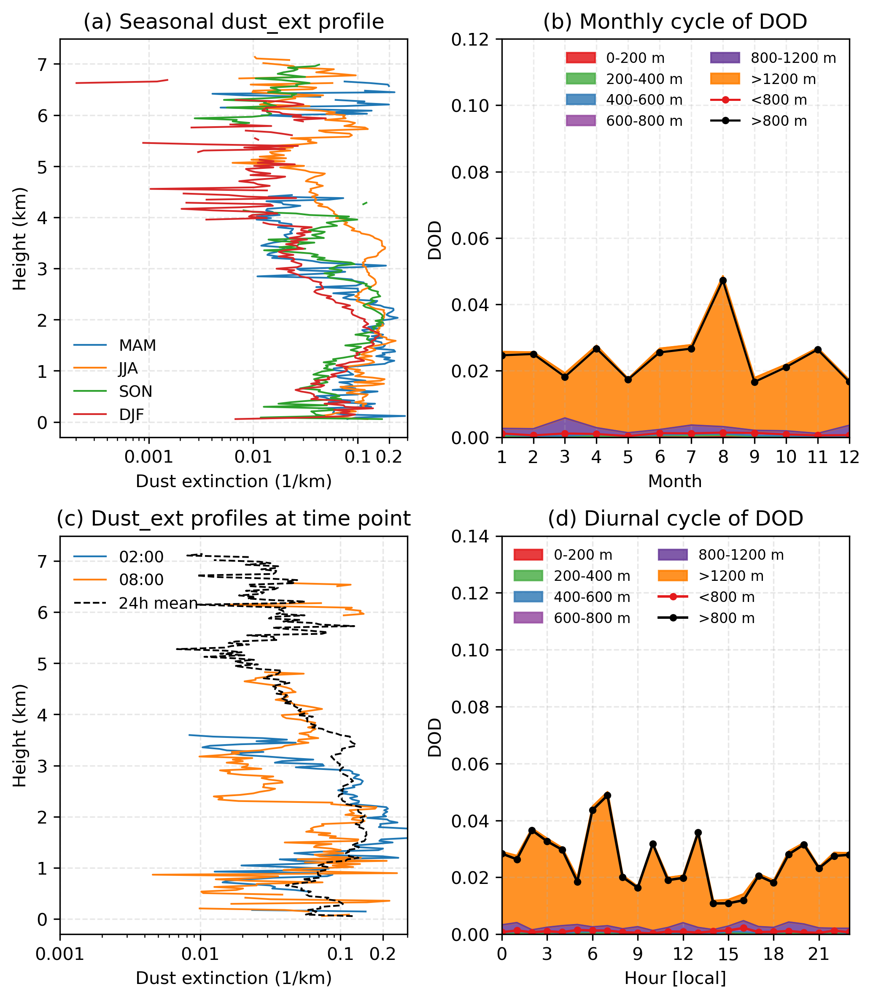

In [42]:
plot_overview_for_label(results_by_label[0], title_tag="(top)")

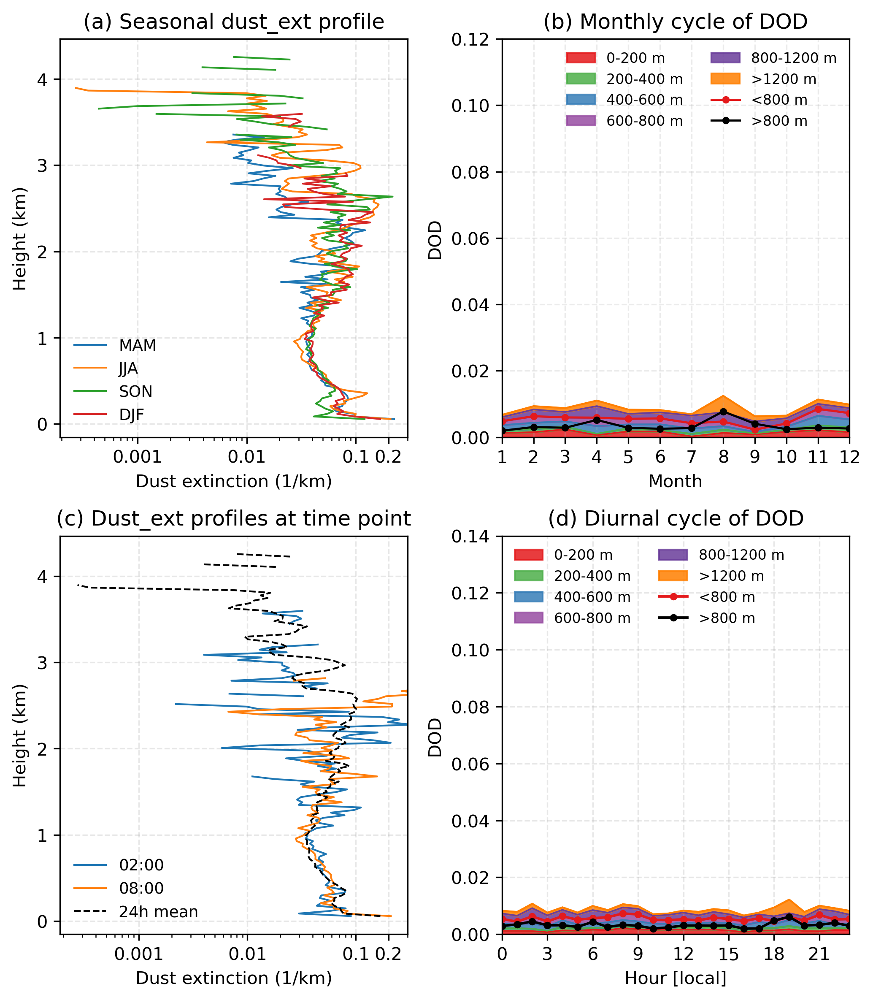

In [43]:
plot_overview_for_label(results_by_label[1], title_tag="(bottom)")

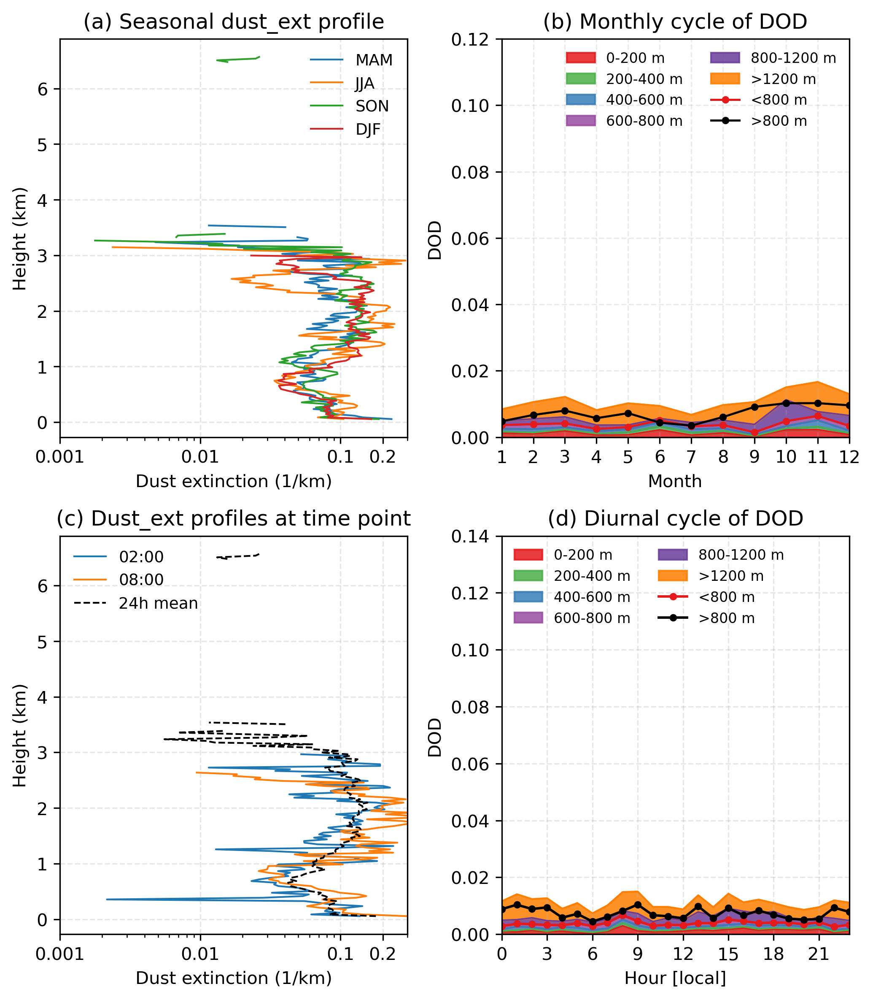

In [44]:
plot_overview_for_label(results_by_label[2], title_tag="(middle)")

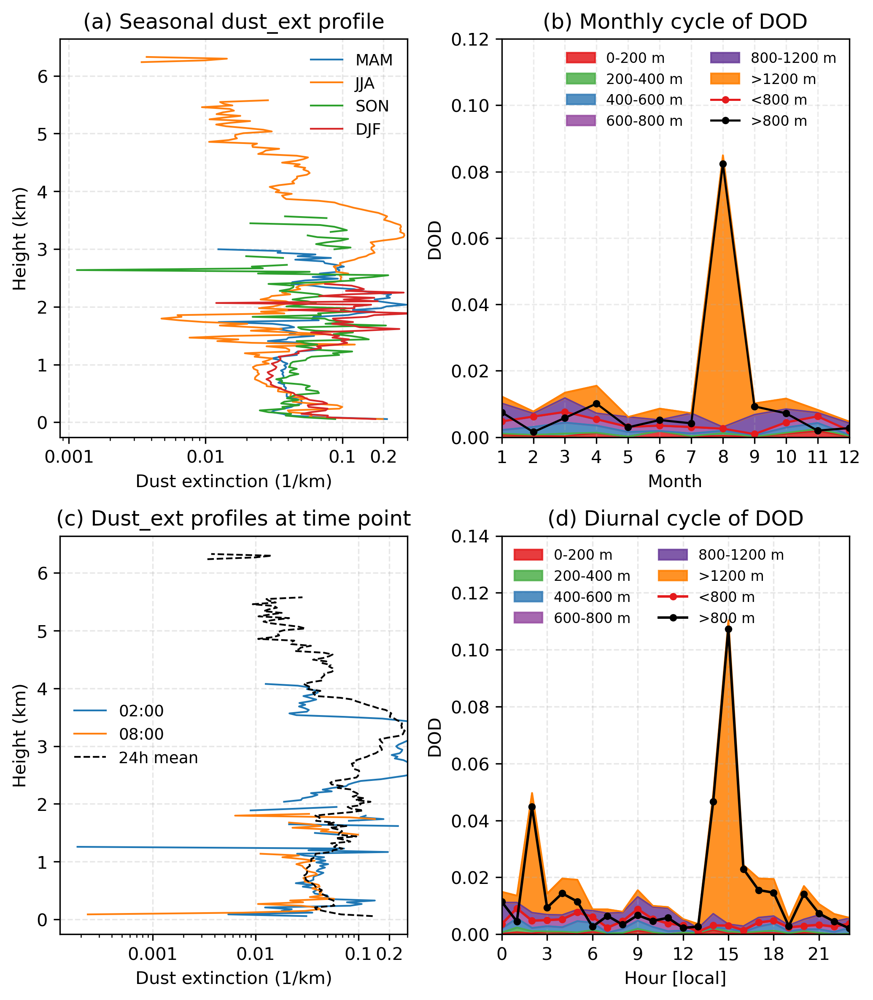

In [45]:
plot_overview_for_label(results_by_label[3], title_tag="(decreasing)")

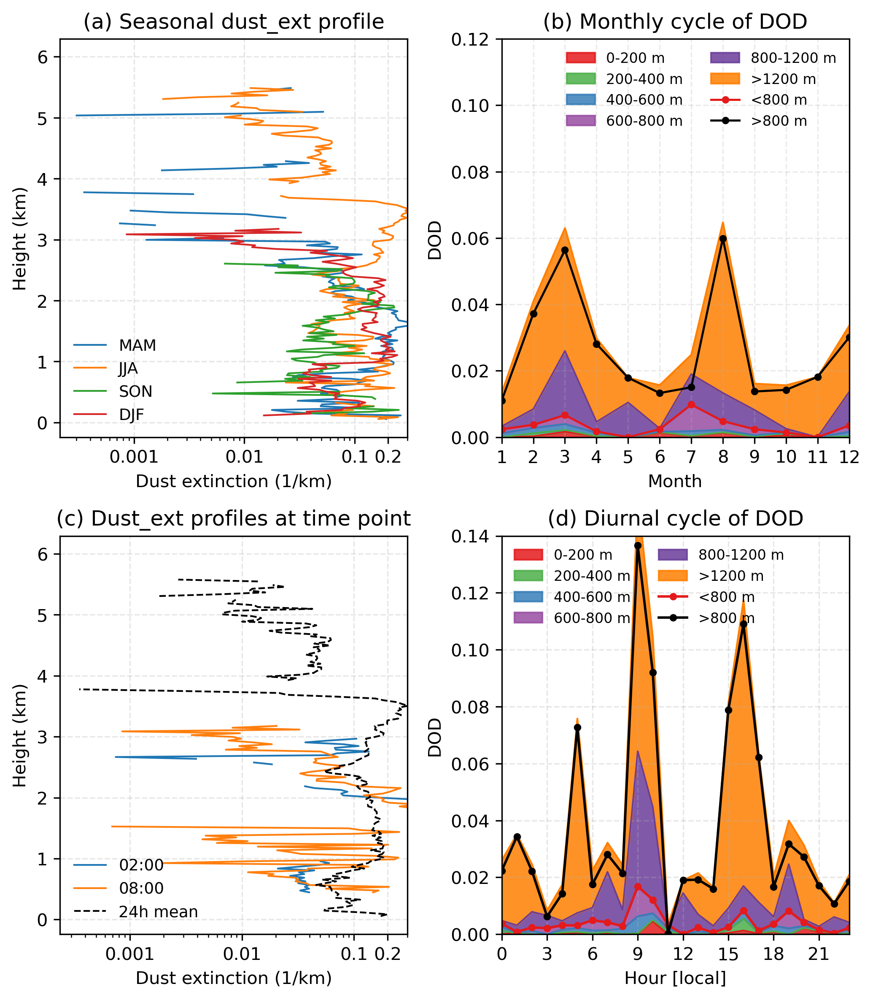

In [46]:
plot_overview_for_label(results_by_label[4], title_tag="(increasing)")

## Sensitive test of ∂ln(LWP)/∂ln(DOD), -∂ln(Re)/∂ln(DOD)

### ∂ln(LWP)/∂ln(DOD)

In [36]:
import numpy as np

# 可选：用 scipy 获得 t 分布置信区间；没有就用正态近似
try:
    from scipy.stats import linregress, t
    _HAVE_SCIPY = True
except Exception:
    _HAVE_SCIPY = False

def _linregress_with_ci(x, y):
    x = np.asarray(x, float).ravel()
    y = np.asarray(y, float).ravel()
    n = x.size
    if n < 3:
        return np.nan, np.nan, np.nan, n, (np.nan, np.nan)

    if _HAVE_SCIPY:
        lr = linregress(x, y)
        slope, intercept, stderr = lr.slope, lr.intercept, lr.stderr
        tcrit = t.ppf(0.975, df=n-2) if n > 2 else np.nan
        ci = (slope - tcrit*stderr, slope + tcrit*stderr)
        return slope, intercept, stderr, n, ci
    else:
        xm, ym = x.mean(), y.mean()
        Sxx = np.sum((x - xm)**2)
        Sxy = np.sum((x - xm)*(y - ym))
        slope = Sxy / Sxx if Sxx != 0 else np.nan
        intercept = ym - slope*xm
        dof = n - 2
        if dof <= 0 or not np.isfinite(slope) or Sxx <= 0:
            return slope, intercept, np.nan, n, (np.nan, np.nan)
        yhat = intercept + slope*x
        resid = y - yhat
        s2 = np.sum(resid**2) / dof
        stderr = np.sqrt(s2 / Sxx)
        z = 1.96
        ci = (slope - z*stderr, slope + z*stderr)
        return slope, intercept, stderr, n, ci

def compute_rlws(DOD_by_cat, lwp_by_cat, 
                 categories=("top","bottom","middle","decreasing","increasing")):
    """
    计算各类和 total 的相对液态水敏感度
    返回 results dict 和 order 列表
    """
    results = {}
    dod_all, lwp_all = [], []

    for cat in categories:
        DOD = np.asarray(DOD_by_cat[cat], float)
        LWP = np.asarray(lwp_by_cat[cat], float)
        if DOD.shape != LWP.shape:
            raise ValueError(f"{cat}: shape mismatch {DOD.shape} vs {LWP.shape}")
        m = np.isfinite(DOD) & np.isfinite(LWP) & (DOD > 0) & (LWP > 0)
        DOD_f, LWP_f = DOD[m], LWP[m]

        if DOD_f.size >= 3:
            slope, intercept, stderr, n, (ci_low, ci_high) = _linregress_with_ci(np.log(DOD_f), np.log(LWP_f))
            results[cat] = dict(slope=slope, ci_low=ci_low, ci_high=ci_high, stderr=stderr, n=n)
            dod_all.append(DOD_f); lwp_all.append(LWP_f)
        else:
            results[cat] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=DOD_f.size)

    # total
    if dod_all:
        DOD_tot, LWP_tot = np.concatenate(dod_all), np.concatenate(lwp_all)
        if DOD_tot.size >= 3:
            slope, intercept, stderr, n, (ci_low, ci_high) = _linregress_with_ci(np.log(DOD_tot), np.log(LWP_tot))
            results["total"] = dict(slope=slope, ci_low=ci_low, ci_high=ci_high, stderr=stderr, n=n)
        else:
            results["total"] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=DOD_tot.size)
    else:
        results["total"] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=0)

    order = list(categories) + ["total"]
    return results, order
results, order = compute_rlws(DOD_by_cat, lwp_by_cat)

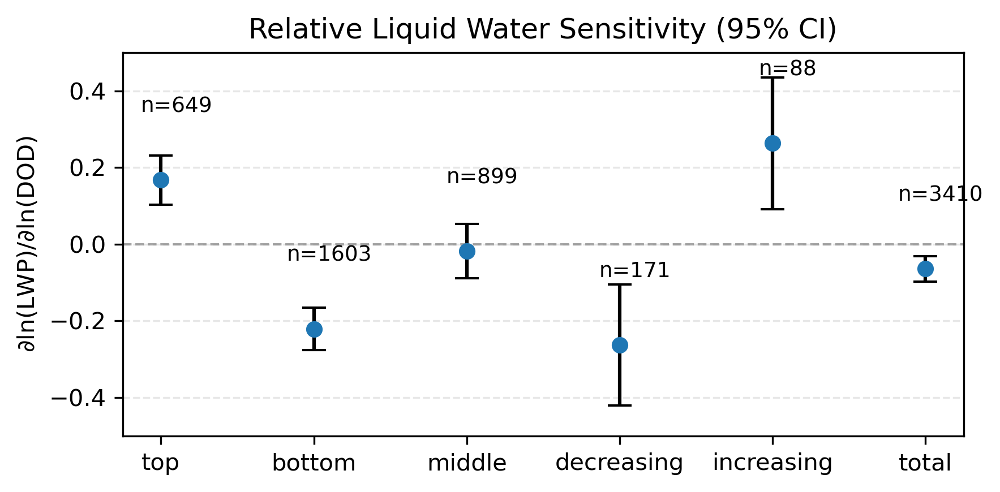

In [37]:
import numpy as np
import matplotlib.pyplot as plt

def plot_rlws_vertical_barstyle(results, order):
    """
    绘制竖直误差条图：
    横坐标=类别，纵坐标=敏感度
    点=斜率，误差条=95%CI
    """
    cats   = list(order)
    slopes = np.array([results[c]["slope"] for c in cats], float)
    ci_low = np.array([results[c]["ci_low"] for c in cats], float)
    ci_high= np.array([results[c]["ci_high"] for c in cats], float)
    ns     = np.array([results[c]["n"] for c in cats], int)

    # 误差条长度
    yerr = [slopes - ci_low, ci_high - slopes]

    x = np.arange(len(cats))
    fig, ax = plt.subplots(figsize=(6,3), dpi=300)

    # 只画点和误差条，不要bar
    ax.errorbar(x, slopes, yerr=yerr, fmt='o', capsize=5, markersize=6,
                color="tab:blue", ecolor="black")

    # 标注样本量
    for xi, si, ni in zip(x, slopes, ns):
        if np.isfinite(si):
            ax.text(xi+0.1, si+0.165, f"n={ni}", ha="center", va="bottom", fontsize=9)

    ax.axhline(0, ls="--", lw=1, color="gray", alpha=0.7)
    ax.set_xticks(x)
    # ax.set_xlim(-1,6)
    ax.set_ylim(-0.5,0.5)
    ax.set_xticklabels(cats,)
    ax.set_ylabel(r"$\partial \ln(\mathrm{LWP}) / \partial \ln(\mathrm{DOD})$")
    ax.set_title("Relative Liquid Water Sensitivity (95% CI)")
    ax.grid(axis="y", alpha=0.3, ls="--")

    plt.tight_layout()
    plt.show()

# === 示例 ===
results, order = compute_rlws(DOD_by_cat, lwp_by_cat)
plot_rlws_vertical_barstyle(results, order)


### -∂ln(Re)/∂ln(DOD)

In [38]:
import numpy as np
from typing import Dict, Tuple, Sequence, Mapping

try:
    from scipy import stats as _scistats
    _has_scipy = True
except Exception:
    _has_scipy = False


def _linregress_with_ci(x, y, alpha=0.05):
    """线性回归 + 置信区间"""
    x, y = np.asarray(x, float), np.asarray(y, float)
    n = len(x)
    if n < 3:
        return np.nan, np.nan, np.nan, n, (np.nan, np.nan)

    xbar, ybar = x.mean(), y.mean()
    Sxx = np.sum((x - xbar) ** 2)
    Sxy = np.sum((x - xbar) * (y - ybar))
    if Sxx == 0:
        return np.nan, np.nan, np.nan, n, (np.nan, np.nan)

    slope = Sxy / Sxx
    intercept = ybar - slope * xbar
    resid = y - (intercept + slope * x)
    dof = max(n - 2, 1)
    s2 = np.sum(resid**2) / dof
    se_slope = np.sqrt(s2 / Sxx)
    tcrit = _scistats.t.ppf(1 - alpha / 2, dof) if _has_scipy else 1.96
    return slope, intercept, se_slope, n, (slope - tcrit * se_slope, slope + tcrit * se_slope)


def compute_aci_re_by_lwp_bins(
    DOD_by_cat: Mapping[str, Sequence[float]],
    LWP_by_cat: Mapping[str, Sequence[float]],
    COD_by_cat: Mapping[str, Sequence[float]],
    categories=("top","bottom","middle","decreasing","increasing"),
    lwp_bins=((0, 20.0), (20, 40), (40, 60), (60, 150.0))
):
    """
    计算各类 + total 的 ACI_Re = - d ln(Re) / d ln(DOD)，在指定 LWP 桶内。
    同时输出每个类别聚合后的 Re 数组（含 NaN），并且保证：
      re_by_cat[cat].shape == DOD_by_cat[cat].shape == LWP_by_cat[cat].shape == COD_by_cat[cat].shape
    """
    rho_l = 1
    const = 3.0 / (2.0 * rho_l)

    results = {}
    # ⚠️ 现在直接存 ndarray，而不是 list
    re_by_cat: Dict[str, np.ndarray] = {}
    bin_order = []
    cat_order = list(categories) + ["total"]

    # 先为每个类别构建一次“含 NaN 的完整 Re 向量”
    for cat in categories:
        DOD = np.asarray(DOD_by_cat[cat], float)
        LWP = np.asarray(LWP_by_cat[cat], float)
        COD = np.asarray(COD_by_cat[cat], float)

        # 与输入等长：先全 NaN，再在“都有效”的位置计算 Re
        re_full = np.full_like(DOD, np.nan)
        valid_idx = np.isfinite(DOD) & np.isfinite(LWP) & np.isfinite(COD)
        # 只有在 >0 的地方 Re 才有物理意义；否则保留 NaN
        pos_idx = valid_idx & (DOD > 0) & (LWP > 0) & (COD > 0)
        re_full[pos_idx] = const * LWP[pos_idx] / COD[pos_idx]

        re_by_cat[cat] = re_full  # ✅ 与原数组同维度（含 NaN）

    # 接着做逐 LWP 桶的回归统计（不再往 re_by_cat 里 append）
    for (lo, hi) in lwp_bins:
        bin_label = f"LWP:{lo:.0f}-{hi:.0f}"
        bin_order.append(bin_label)
        results[bin_label] = {}

        dod_all, re_all = [], []

        for cat in categories:
            DOD = np.asarray(DOD_by_cat[cat], float)
            LWP = np.asarray(LWP_by_cat[cat], float)
            re_full = re_by_cat[cat]

            # 仅用于回归时的掩码：在 >0 且落在 LWP 桶中的样本
            m = np.isfinite(DOD) & np.isfinite(re_full) & (DOD > 0) & (re_full > 0)
            m &= np.isfinite(LWP) & (LWP >= lo) & (LWP < hi)

            if not np.any(m):
                results[bin_label][cat] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=0)
                continue

            x, y = np.log(DOD[m]), np.log(re_full[m])
            if len(x) < 3:
                results[bin_label][cat] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=len(x))
                continue

            slope, intercept, stderr, n, (ci_low, ci_high) = _linregress_with_ci(x, y)
            aci = -slope
            results[bin_label][cat] = dict(
                slope=aci, ci_low=-ci_high, ci_high=-ci_low, stderr=stderr, n=n
            )
            dod_all.append(np.exp(x)); re_all.append(np.exp(y))

        # total
        if dod_all:
            dod_tot = np.concatenate(dod_all)
            re_tot  = np.concatenate(re_all)
            if len(dod_tot) >= 3:
                slope, intercept, stderr, n, (ci_low, ci_high) = _linregress_with_ci(np.log(dod_tot), np.log(re_tot))
                aci = -slope
                results[bin_label]["total"] = dict(
                    slope=aci, ci_low=-ci_high, ci_high=-ci_low, stderr=stderr, n=n
                )
            else:
                results[bin_label]["total"] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=len(dod_tot))
        else:
            results[bin_label]["total"] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=0)

    return results, bin_order, cat_order, re_by_cat


results, bin_order, cat_order, re_by_cat = compute_aci_re_by_lwp_bins(DOD_by_cat, lwp_by_cat, COD_by_cat)

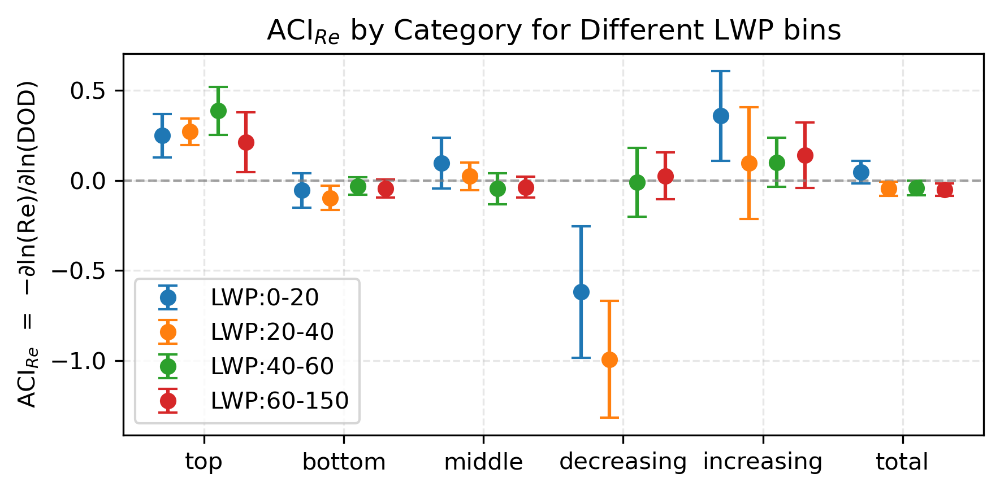

In [39]:
import numpy as np
import matplotlib.pyplot as plt

def plot_aci_re_vertical_multibin(results, bin_order, cat_order=None,
                                  title="ACI$_{Re}$ by Category for Different LWP bins"):
    """
    在一张图中绘制多个 LWP 桶的 ACI_Re：
    横坐标 = 类别
    纵坐标 = ACI_Re
    不同颜色表示不同的 LWP 桶
    """
    if cat_order is None:
        # 默认顺序：把 total 放最后
        cats = [c for c in results[bin_order[0]].keys() if c != "total"] + ["total"]
    else:
        cats = list(cat_order)

    x = np.arange(len(cats))
    colors = plt.cm.tab10.colors  # 颜色循环

    fig, ax = plt.subplots(figsize=(6,3), dpi=300)

    for i, b in enumerate(bin_order):
        slopes = np.array([results[b][c]["slope"] for c in cats], float)
        lo     = np.array([results[b][c]["ci_low"] for c in cats], float)
        hi     = np.array([results[b][c]["ci_high"] for c in cats], float)
        ns     = np.array([results[b][c]["n"] for c in cats], int)

        yerr = np.vstack([slopes - lo, hi - slopes])

        # 为了防止重叠：每个 LWP 桶横坐标微移
        offset = (i - (len(bin_order)-1)/2)*0.2
        x_shifted = x + offset

        ax.errorbar(x_shifted, slopes, yerr=yerr, fmt='o', capsize=4, markersize=6,
                    color=colors[i % len(colors)], ecolor=colors[i % len(colors)],
                    label=b)

        # 样本量标注
        # for xi, si, ni in zip(x_shifted, slopes, ns):
        #     if np.isfinite(si):
        #         ax.text(xi, si, f"n={ni}", ha="center", va="bottom", fontsize=8,
        #                 color=colors[i % len(colors)])

    ax.axhline(0, ls="--", lw=1, color="gray", alpha=0.7)
    ax.set_xticks(x)
    ax.set_xticklabels(cats)
    ax.set_ylabel(r"ACI$_{Re}$  =  $-\partial \ln(\mathrm{Re}) / \partial \ln(\mathrm{DOD})$")
    ax.set_title(title)
    ax.legend()
    ax.grid(alpha=0.3, ls="--")

    plt.tight_layout()
    plt.show()

# === 示例 ===
# results, bin_order, cat_order = compute_aci_re_by_lwp_bins(DOD_by_cat, LWP_by_cat, COD_by_cat)
plot_aci_re_vertical_multibin(results, bin_order, cat_order)


## Influence of Meteorology Covariation

In [40]:
RH   =  ds_mete.RH_750_850.values
TEMP =  ds_mete.TEMP_750_850.values
VWS  =  ds_mete.VWS_725_925.values
LTS  =  ds_mete.LTS.values
VV   =  ds_vv.w_750_850hPa.values
mask_valid = ~np.isnan(labels)

dust_AOD_valid = dust_AOD[mask_valid]
COD_valid      = COD[mask_valid]
lwp_valid      = lwp[mask_valid]
RH_valid       = RH[mask_valid]
TEMP_valid     = TEMP[mask_valid]
VWS_valid      = VWS[mask_valid]
LTS_valid      = LTS[mask_valid]
VV_valid       = VV[mask_valid]

In [31]:
import numpy as np

def split_by_quantile(var, q=[0, 1/3, 2/3, 1]):
    """按分位数将变量划分为三段（low/mid/high），返回索引字典"""
    bins = np.nanquantile(var, q)
    idx_low  = (var >= bins[0]) & (var < bins[1])
    idx_mid  = (var >= bins[1]) & (var < bins[2])
    idx_high = (var >= bins[2]) & (var <= bins[3])
    return {"low": idx_low, "mid": idx_mid, "high": idx_high}

# ===== 按分位数划分 =====
rh_bins  = split_by_quantile(RH_valid)
lts_bins = split_by_quantile(LTS_valid)
vws_bins = split_by_quantile(VWS_valid)
vv_bins = split_by_quantile(VV_valid)

# ===== 获取每档对应的 dust_AOD / COD / LWP =====
def extract_by_bins(bins_dict, name):
    out = {}
    for k, idx in bins_dict.items():
        out[k] = {
            "dust_AOD": dust_AOD_valid[idx],
            "COD":      COD_valid[idx],
            "LWP":      lwp_valid[idx],
        }
        print(f"{name} {k}: {np.sum(idx)} samples")
    return out

rh_groups  = extract_by_bins(rh_bins,  "RH")
lts_groups = extract_by_bins(lts_bins, "LTS")
vws_groups = extract_by_bins(vws_bins, "VWS")
vv_groups = extract_by_bins(vv_bins, "VV")

RH low: 17002 samples
RH mid: 17002 samples
RH high: 17002 samples
LTS low: 17002 samples
LTS mid: 17002 samples
LTS high: 17002 samples
VWS low: 17002 samples
VWS mid: 17002 samples
VWS high: 17002 samples
VV low: 14343 samples
VV mid: 14343 samples
VV high: 14344 samples


In [32]:
import numpy as np
import matplotlib.pyplot as plt

# ========= 参数（可调） =========
window_width = 0.010   # 滑动窗口的x宽度（dust_AOD的绝对尺度）
step          = 0.001  # 窗口步长（越小越平滑）
min_count_win = 8      # 每个窗口最少样本数（用于过滤稀疏窗口）
q_clip        = (0.05, 0.95)  # 去极值分位

# ========= 工具函数 =========
def split_by_quantile(var, q=(0, 1/3, 2/3, 1)):
    """
    按分位数将变量划分为三段（low/mid/high），返回布尔索引字典和边界。
    var: 1-D ndarray
    """
    var = np.asarray(var, dtype=float)
    finite = np.isfinite(var)
    if finite.sum() == 0:
        edges = np.array([np.nan, np.nan, np.nan, np.nan])
        zeros = np.zeros_like(var, dtype=bool)
        return {"low": zeros, "mid": zeros, "high": zeros}, edges
    edges = np.nanquantile(var[finite], q)
    # 低、中为左闭右开，高为闭区间，避免边界丢点
    idx_low  = (var >= edges[0]) & (var <  edges[1])
    idx_mid  = (var >= edges[1]) & (var <  edges[2])
    idx_high = (var >= edges[2]) & (var <= edges[3])
    return {"low": idx_low, "mid": idx_mid, "high": idx_high}, edges

def moving_window_xy(x, y, xmin, xmax, width, step):
    """
    对 (x, y) 做滑动窗口平均，返回字典：
    centers, x_mean, y_mean, y_sem, count
    """
    centers = np.arange(xmin + width/2, xmax - width/2 + step/2, step)

    x_mean = np.full_like(centers, np.nan, dtype=float)
    y_mean = np.full_like(centers, np.nan, dtype=float)
    y_sem  = np.full_like(centers, np.nan, dtype=float)
    count  = np.zeros_like(centers, dtype=int)

    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if x.size == 0:
        return {"centers": centers, "x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

    half = width / 2.0
    for i, c in enumerate(centers):
        sel = (x >= c - half) & (x < c + half)
        if sel.any():
            xb, yb = x[sel], y[sel]
            count[i]  = xb.size
            x_mean[i] = np.nanmean(xb)
            y_mean[i] = np.nanmean(yb)
            if xb.size > 1:
                y_sem[i] = np.nanstd(yb, ddof=1) / np.sqrt(xb.size)

    return {"centers": centers, "x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

# ========= 1) 用 labels 做基础有效筛选 =========
# 这里假设你已经在上一步得到了：labels, dust_AOD, COD, lwp, RH, LTS, VWS（shape完全一致）
# 并且 labels 中 NaN 表示无效位置
mask_valid = ~np.isnan(labels)

# 取出有效样本（注意：如果这些是 xarray.DataArray/dask，需要 .compute().values 或 np.asarray）
x_all   = np.asarray(dust_AOD[mask_valid])   # dust_AOD 有效样本
COD_all = np.asarray(COD[mask_valid])
LWP_all = np.asarray(lwp[mask_valid])
RH_all  = np.asarray(RH[mask_valid])
LTS_all = np.asarray(LTS[mask_valid])
VWS_all = np.asarray(VWS[mask_valid])

# ========= 2) 用 dust_AOD 的 5–95% 分位去极值，并同步应用到其它变量 =========
finite_x = np.isfinite(x_all)
if finite_x.sum() == 0:
    raise ValueError("dust_AOD 有效样本全为 NaN，无法计算分位数。")

q_lo, q_hi = np.nanquantile(x_all[finite_x], q_clip)
keep = (x_all >= q_lo) & (x_all <= q_hi)
# 同步保证 y 与分组变量都是有限值
keep &= np.isfinite(COD_all) & np.isfinite(LWP_all)
keep &= np.isfinite(RH_all) & np.isfinite(LTS_all) & np.isfinite(VWS_all)

x      = x_all[keep]
COD_y  = COD_all[keep]
LWP_y  = LWP_all[keep]
RH_g   = RH_all[keep]
LTS_g  = LTS_all[keep]
VWS_g  = VWS_all[keep]

# ========= 3) 三分位分组（RH / LTS / VWS 各三组） =========
rh_bins,  rh_edges  = split_by_quantile(RH_g)
lts_bins, lts_edges = split_by_quantile(LTS_g)
vws_bins, vws_edges = split_by_quantile(VWS_g)

groups = {
    "RH":  (rh_bins,  rh_edges),
    "LTS": (lts_bins, lts_edges),
    "VWS": (vws_bins, vws_edges),
}

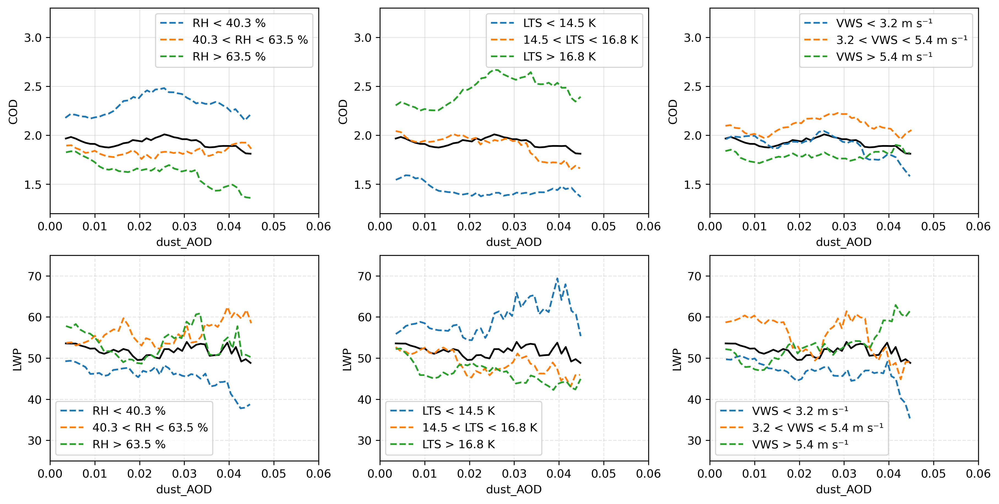

In [33]:
# ========= 4) 绘图（2行×3列）：上排 y=COD，下排 y=LWP；每列对应 RH/LTS/VWS =========
fig, axes = plt.subplots(2, 3, figsize=(12, 6), dpi=300, constrained_layout=True)

linestyles = {"low": "--", "mid": "--", "high": "--", "All": "-"}
# 单位映射表
unit_map = { "RH": "%","LTS": "K","VWS": "m s⁻¹"}

if x.size == 0:
    raise ValueError("筛掉极端值后没有可用样本。请检查 q_clip 或数据是否过少。")

xmin, xmax = np.nanmin(x), np.nanmax(x)

for j, (gv_name, (bin_dict, edges)) in enumerate(groups.items()):
    # ---------- 第一行：COD ----------
    ax_cod = axes[0, j]
    unit = unit_map.get(gv_name, "")
    # 绘制 All data（不出现在图例）
    res_all = moving_window_xy(x, COD_y, xmin, xmax, window_width, step)
    m_all = res_all["count"] >= min_count_win
    ax_cod.plot(res_all["x_mean"][m_all], res_all["y_mean"][m_all],
                color="black", linestyle=linestyles["All"], label="_nolegend_")

    # 仅画三个区间线
    idx_low, idx_mid, idx_high = bin_dict["low"], bin_dict["mid"], bin_dict["high"]
    labels_formatted = [
        f"{gv_name} < {edges[1]:.1f} {unit}",
        f"{edges[1]:.1f} < {gv_name} < {edges[2]:.1f} {unit}",
        f"{gv_name} > {edges[2]:.1f} {unit}"
    ]
    idx_list = [idx_low, idx_mid, idx_high]

    for idx, lbl, style in zip(idx_list, labels_formatted, ["--", "--", "--"]):
        if idx.sum() == 0:
            continue
        res = moving_window_xy(x[idx], COD_y[idx], xmin, xmax, window_width, step)
        m = res["count"] >= min_count_win
        ax_cod.plot(res["x_mean"][m], res["y_mean"][m],
                    label=lbl, linestyle=style)

    ax_cod.set_xlabel("dust_AOD")
    ax_cod.set_ylabel("COD")
    ax_cod.grid(True, alpha=0.3)
    ax_cod.set_xlim(0, 0.06)
    ax_cod.set_ylim(1.2, 3.3)
    ax_cod.legend()

    # ---------- 第二行：LWP ----------
    ax_lwp = axes[1, j]

    res_all = moving_window_xy(x, LWP_y, xmin, xmax, window_width, step)
    m_all = res_all["count"] >= min_count_win
    ax_lwp.plot(res_all["x_mean"][m_all], res_all["y_mean"][m_all],
                color="black", linestyle=linestyles["All"], label="_nolegend_")

    for idx, lbl, style in zip(idx_list, labels_formatted, ["--", "--", "--"]):
        if idx.sum() == 0:
            continue
        res = moving_window_xy(x[idx], LWP_y[idx], xmin, xmax, window_width, step)
        m = res["count"] >= min_count_win
        ax_lwp.plot(res["x_mean"][m], res["y_mean"][m],
                    label=lbl, linestyle=style)

    ax_lwp.set_xlabel("dust_AOD")
    ax_lwp.set_ylabel("LWP")
    ax_lwp.grid(ls='--', alpha=0.3)
    ax_lwp.set_xlim(0, 0.06)
    ax_lwp.set_ylim(25, 75)
    ax_lwp.legend()

plt.show()

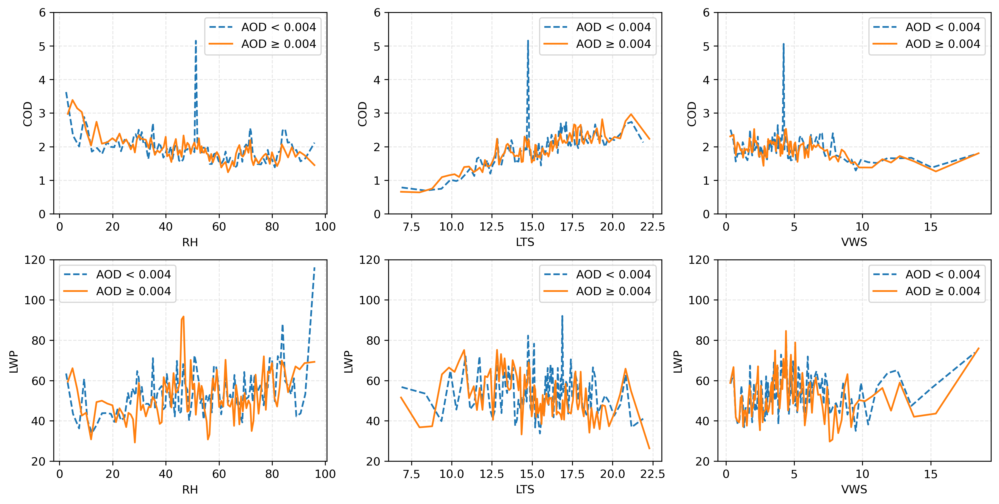

dust_AOD 去极值分位阈值: (0.05, 0.95) => [0.000, 0.051]
AOD 分组阈值 aod_split = 0.004  (中位数)
等频分箱: n_bins=100, 过滤条件: count >= 8


In [34]:
import numpy as np
import matplotlib.pyplot as plt

# ========= 参数 =========
q_clip        = (0.05, 0.95)   # dust_AOD 去极值分位
AOD_SPLIT     = None           # None=用去极值后的中位数；若要固定阈值（如论文 0.146），设为 0.146
n_bins        = 100            # 等频分箱数量
min_count_bin = 8              # 每个bin最少样本数（过小会抖动，可视数据量调整）

# ========= 等频滑动平均 =========
def equal_frequency_xy(x, y, n_bins=100):
    """
    等频平滑：将 x 升序排序并等分为 n_bins 份，每份样本数尽量相等。
    返回 dict: x_mean, y_mean, y_sem, count
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if x.size == 0:
        return {"x_mean": np.array([]), "y_mean": np.array([]), "y_sem": np.array([]), "count": np.array([])}
    order = np.argsort(x)
    x_sorted, y_sorted = x[order], y[order]
    n = x_sorted.size
    # 边界索引（等频分箱）
    edges = np.linspace(0, n, n_bins + 1, dtype=int)

    x_mean = np.full(n_bins, np.nan)
    y_mean = np.full(n_bins, np.nan)
    y_sem  = np.full(n_bins, np.nan)
    count  = np.zeros(n_bins, dtype=int)

    for i in range(n_bins):
        s, e = edges[i], edges[i+1]
        if e - s < 1:
            continue
        xb, yb = x_sorted[s:e], y_sorted[s:e]
        x_mean[i] = np.nanmean(xb)
        y_mean[i] = np.nanmean(yb)
        count[i]  = xb.size
        if xb.size > 1:
            y_sem[i] = np.nanstd(yb, ddof=1) / np.sqrt(xb.size)

    return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

# ========= 0) 基础有效筛选（若你已用 labels 做过筛选，就沿用；否则全 True）========
try:
    base_mask = ~np.isnan(labels)
except NameError:
    base_mask = np.ones_like(dust_AOD, dtype=bool)

# 转为 numpy 并套用基础掩膜
x_aod  = np.asarray(dust_AOD)[base_mask]
COD_y  = np.asarray(COD)[base_mask]
LWP_y  = np.asarray(lwp)[base_mask]
RH_x   = np.asarray(RH)[base_mask]
LTS_x  = np.asarray(LTS)[base_mask]
VWS_x  = np.asarray(VWS)[base_mask]

# ========= 1) dust_AOD 5–95% 去极值，并同步到所有变量 =========
finite = np.isfinite(x_aod)
if finite.sum() == 0:
    raise ValueError("dust_AOD 有效样本全为 NaN，无法计算分位数。")
q_lo, q_hi = np.nanquantile(x_aod[finite], q_clip)

keep = (x_aod >= q_lo) & (x_aod <= q_hi)
keep &= np.isfinite(COD_y) & np.isfinite(LWP_y)
keep &= np.isfinite(RH_x) & np.isfinite(LTS_x) & np.isfinite(VWS_x)

x_aod = x_aod[keep]
COD_y = COD_y[keep]
LWP_y = LWP_y[keep]
RH_x  = RH_x[keep]
LTS_x = LTS_x[keep]
VWS_x = VWS_x[keep]

if x_aod.size == 0:
    raise ValueError("去极值后样本为空，请调整 q_clip 或检查数据。")

# ========= 2) AOD 高低分组（默认中位数；可改为固定 0.146）=========
aod_split = np.nanmedian(x_aod) if AOD_SPLIT is None else float(AOD_SPLIT)
idx_lowAOD  = x_aod <  aod_split
idx_highAOD = x_aod >= aod_split

# ========= 3) 画 2×3 图：上排 COD，下排 LWP；列为 RH/LTS/VWS =========
fig, axes = plt.subplots(2, 3, figsize=(12, 6), dpi=300, constrained_layout=True)

pairs = [
    ("RH",  RH_x,  "COD", COD_y, (0, 0), {"ylim": (0, 6)}),
    ("LTS", LTS_x, "COD", COD_y, (0, 1), {"ylim": (0, 6)}),
    ("VWS", VWS_x, "COD", COD_y, (0, 2), {"ylim": (0, 6)}),
    ("RH",  RH_x,  "LWP", LWP_y, (1, 0), {"ylim": (20, 120)}),
    ("LTS", LTS_x, "LWP", LWP_y, (1, 1), {"ylim": (20, 120)}),
    ("VWS", VWS_x, "LWP", LWP_y, (1, 2), {"ylim": (20, 120)}),
]

for name_x, xvar, name_y, yvar, (ri, ci), opts in pairs:
    ax = axes[ri, ci]

    # 低 AOD（虚线）
    if np.any(idx_lowAOD):
        res_low = equal_frequency_xy(xvar[idx_lowAOD], yvar[idx_lowAOD], n_bins=n_bins)
        m = res_low["count"] >= min_count_bin
        ax.plot(res_low["x_mean"][m], res_low["y_mean"][m],
                linestyle="--", label=f"AOD < {aod_split:.3f}")

    # 高 AOD（实线）
    if np.any(idx_highAOD):
        res_high = equal_frequency_xy(xvar[idx_highAOD], yvar[idx_highAOD], n_bins=n_bins)
        m = res_high["count"] >= min_count_bin
        ax.plot(res_high["x_mean"][m], res_high["y_mean"][m],
                linestyle="-", label=f"AOD ≥ {aod_split:.3f}")

    ax.set_xlabel(name_x)
    ax.set_ylabel(name_y)
    ax.grid(ls='--', alpha=0.3)
    if "ylim" in opts:
        ax.set_ylim(*opts["ylim"])
    ax.legend()

plt.show()

print(f"dust_AOD 去极值分位阈值: {q_clip} => [{q_lo:.3f}, {q_hi:.3f}]")
print(f"AOD 分组阈值 aod_split = {aod_split:.3f}  ({'中位数' if AOD_SPLIT is None else '自定义'})")
print(f"等频分箱: n_bins={n_bins}, 过滤条件: count >= {min_count_bin}")


### Mete of 5 Categories

In [41]:
RH_by_cat = {}
TEMP_by_cat  = {}
VWS_by_cat = {}
LTS_by_cat = {}
VV_by_cat  = {}

for name in cat_names:
    
    lab_id = class_map[name]
    
    RH_by_cat[name]    = extract_event_means(labels, RH, lab_id)
    TEMP_by_cat[name]  = extract_event_means(labels, TEMP, lab_id)
    VWS_by_cat[name]   = extract_event_means(labels, VWS, lab_id)
    LTS_by_cat[name]   = extract_event_means(labels, LTS, lab_id)
    VV_by_cat[name]    = extract_event_means(labels, VV, lab_id)

In [42]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
# ========= 参数（可调） =========
window_width = 0.01   # 滑动窗口的 x 宽度（dust AOD 的绝对尺度）
step          = 0.001  # 窗口步长
min_count_win = 8      # 每个窗口最少样本数（过滤稀疏窗口）
q_clip        = (0.05, 0.95)  # 去极值分位（对 x 和 y 分别按该分位裁剪）



# ======== 三分位函数 ========
def split_by_quantile(var, q=(0, 1/3, 2/3, 1), mask=None):
    var = np.asarray(var)
    if mask is None:
        mask = np.isfinite(var)
    else:
        mask = np.isfinite(var) & mask

    qs = np.quantile(var[mask], q)
    labels = np.full(var.shape, np.nan)
    for i in range(len(qs)-1):
        left, right = qs[i], qs[i+1]
        if i < len(qs)-2:
            sel = (var >= left) & (var < right)
        else:
            sel = (var >= left) & (var <= right)
        labels[sel & mask] = i
    return labels, qs.tolist()


# ======== 滑动窗口函数 ========
def moving_window_xy(x, y, xmin, xmax, width, step):
    x = np.asarray(x)
    y = np.asarray(y)
    good = np.isfinite(x) & np.isfinite(y)
    x, y = x[good], y[good]
    if x.size == 0:
        return dict(x_center=np.array([]), y_mean=np.array([]), x_mean=np.array([]),
                    count=np.array([]), y_std=np.array([]))

    # 去极值分位裁剪
    lo_x, hi_x = np.quantile(x, q_clip)
    lo_y, hi_y = np.quantile(y, q_clip)
    keep = (x >= lo_x) & (x <= hi_x) & (y >= lo_y) & (y <= hi_y)
    x, y = x[keep], y[keep]
    if x.size == 0:
        return dict(x_center=np.array([]), y_mean=np.array([]), x_mean=np.array([]),
                    count=np.array([]), y_std=np.array([]))

    centers = np.arange(xmin + width/2, xmax - width/2 + step/2, step)
    x_center_list, y_mean_list, x_mean_list, count_list, y_std_list = [], [], [], [], []
    half = width / 2.0
    for c in centers:
        sel = (x >= (c - half)) & (x < (c + half))
        if not np.any(sel):
            continue
        n = sel.sum()
        if n < min_count_win:
            continue
        xs = x[sel]
        ys = y[sel]
        x_center_list.append(c)
        y_mean_list.append(np.nanmean(ys))
        x_mean_list.append(np.nanmean(xs))
        count_list.append(n)
        y_std_list.append(np.nanstd(ys, ddof=1) if n >= 2 else np.nan)

    return dict(
        x_center=np.asarray(x_center_list),
        y_mean=np.asarray(y_mean_list),
        x_mean=np.asarray(x_mean_list),
        count=np.asarray(count_list),
        y_std=np.asarray(y_std_list),
    )


# ======== 主函数：准备结果 ========
def prepare_tercile_curves_per_category(
    cat_names,
    DOD_by_cat,
    COD_by_cat,
    lwp_by_cat,
    re_by_cat,
    control_vars_by_cat_dict,
    window_width,
    step,
    min_count_win
):
    from collections import defaultdict
    import numpy as np, pandas as pd

    tercile_names = {0: 'low', 1: 'mid', 2: 'high'}
    results = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

    for cat in cat_names:
        x_dod = np.asarray(DOD_by_cat[cat], float)
        y_cod = np.asarray(COD_by_cat[cat], float)
        y_lwp = np.asarray(lwp_by_cat[cat], float)
        y_re  = np.asarray(re_by_cat[cat],  float)

        if np.isfinite(x_dod).sum() == 0:
            continue
        x_lo, x_hi = np.quantile(x_dod[np.isfinite(x_dod)], q_clip)

        for ctrl_name, ctrl_dict in control_vars_by_cat_dict.items():
            ctrl = np.asarray(ctrl_dict[cat], float)

            ok = np.isfinite(x_dod) & np.isfinite(ctrl) & np.isfinite(y_cod) & np.isfinite(y_lwp) & np.isfinite(y_re)
            if ok.sum() == 0:
                continue

            x_use, cod_use, lwp_use, re_use, ctrl_use = x_dod[ok], y_cod[ok], y_lwp[ok], y_re[ok], ctrl[ok]

            # 分位 & 记录边界
            tercile_lbls, edges = split_by_quantile(ctrl_use, q=(0, 1/3, 2/3, 1))
            results[cat][ctrl_name]['_edges'] = edges

            # 三分位曲线
            for t_lbl in [0, 1, 2]:
                terc_name = tercile_names[t_lbl]
                mask_t = (tercile_lbls == t_lbl)

                for target, arr in [('COD', cod_use), ('LWP', lwp_use), ('Re', re_use)]:
                    if mask_t.sum() < min_count_win:
                        results[cat][ctrl_name][target][terc_name] = pd.DataFrame({'x': [], 'y': [], 'count': []})
                        continue
                    mw = moving_window_xy(x_use[mask_t], arr[mask_t],
                                          xmin=x_lo, xmax=x_hi,
                                          width=window_width, step=step)
                    df = pd.DataFrame({'x': mw['x_mean'], 'y': mw['y_mean'], 'count': mw['count']})
                    df = df[np.isfinite(df['x']) & np.isfinite(df['y']) & (df['count'] >= min_count_win)]
                    results[cat][ctrl_name][target][terc_name] = df.reset_index(drop=True)

            # 新增：整体（不分分位）曲线 —— 保存到 '_total'
            for target, arr in [('COD', cod_use), ('LWP', lwp_use), ('Re', re_use)]:
                mw_all = moving_window_xy(x_use, arr, xmin=x_lo, xmax=x_hi, width=window_width, step=step)
                df_all = pd.DataFrame({'x': mw_all['x_mean'], 'y': mw_all['y_mean'], 'count': mw_all['count']})
                df_all = df_all[np.isfinite(df_all['x']) & np.isfinite(df_all['y']) & (df_all['count'] >= min_count_win)]
                results[cat][ctrl_name][target]['_total'] = df_all.reset_index(drop=True)

    return results

# ======= 把控制变量集合好并生成 results =======
control_vars_by_cat_dict = {
    'RH':   RH_by_cat,
    'TEMP': TEMP_by_cat,
    'VWS':  VWS_by_cat,
    'LTS':  LTS_by_cat,
    'VV':   VV_by_cat,
}

results = prepare_tercile_curves_per_category(
    cat_names=cat_names,
    DOD_by_cat=DOD_by_cat,
    COD_by_cat=COD_by_cat,
    lwp_by_cat=lwp_by_cat,
    re_by_cat=re_by_cat,
    control_vars_by_cat_dict=control_vars_by_cat_dict,
    window_width=window_width,
    step=step,
    min_count_win=min_count_win
)

print("keys in results:", list(results.keys()))  # 看看有哪些类别被成功处理


keys in results: ['top', 'bottom', 'middle', 'decreasing', 'increasing']


In [43]:
import numpy as np
import matplotlib.pyplot as plt

def plot_category_panel(
    category_name,
    results,
    control_order=('RH','TEMP','VWS','LTS','VV'),
    targets_order=('COD','LWP','Re'),
    figsize=(15, 7),
    suptitle=None,
    xlim_fixed=(0, 0.1),
    units_map=None,
    ylim_map=None,
):
    """
    绘制 3×5 面板：
      - 每列为控制变量（RH, TEMP, VWS, LTS, VV）
      - 每行为目标变量（COD, LWP, Re）
      - 每图包含三条分位线（图例显示分位范围+单位） + 黑色总线('_total')
      - x 轴范围固定为 xlim_fixed（默认 (0, 0.1)）
    依赖的数据结构（由你的 prepare 函数生成）：
      results[cat][ctrl]['_edges'] = [q0,q1,q2,q3]
      results[cat][ctrl][target]['low'/'mid'/'high'] = DataFrame(columns=['x','y','count'])
      results[cat][ctrl][target]['_total']           = DataFrame(columns=['x','y','count'])
    """

    # 默认单位与 y 轴范围
    if units_map is None:
        units_map = {'RH': '%', 'TEMP': '℃', 'VWS': 'm s⁻¹', 'LTS': 'K', 'VV': 'm s⁻¹'}
    if ylim_map is None:
        ylim_map = {'COD': (0, 3.6), 'LWP': (20, 120), 'Re': (10, 180)}

    if category_name not in results:
        raise ValueError(f"category '{category_name}' 不在 results 中。可用类别：{list(results.keys())}")

    # 画布
    fig, axes = plt.subplots(
        nrows=len(targets_order),
        ncols=len(control_order),
        figsize=figsize, dpi=200, constrained_layout=True
    )

    # 三分位样式
    terc_styles = {
        'low':  dict(ls='--', lw=1.5),
        'mid':  dict(ls='-',  lw=1.5),
        'high': dict(ls='-.', lw=1.5)
    }

    # 遍历绘制
    for i, tgt in enumerate(targets_order):       # 行：目标变量
        for j, ctrl in enumerate(control_order):  # 列：控制变量
            ax = axes[i, j]
            handles, labels = [], []

            # 当前控制变量分组
            ctrl_group = results[category_name].get(ctrl, {})
            if not ctrl_group:
                ax.set_visible(False)
                continue

            edges = ctrl_group.get('_edges', None)  # [q0,q1,q2,q3]
            unit = units_map.get(ctrl, '')

            # --- 三条分位线 ---
            for terc, (k1, k2) in zip(('low','mid','high'), [(0,1),(1,2),(2,3)]):
                df = ctrl_group.get(tgt, {}).get(terc, None)
                if df is None or len(df) == 0:
                    continue
                line = ax.plot(df['x'].values, df['y'].values, **terc_styles[terc])
                if edges is not None and np.all(np.isfinite(edges)):
                    label = f"[{edges[k1]:.2f}–{edges[k2]:.2f}] {unit}"
                else:
                    label = terc
                handles.append(line[0])
                labels.append(label)

            # --- 黑色总趋势线（_total） ---
            df_total = ctrl_group.get(tgt, {}).get('_total', None)
            if df_total is not None and len(df_total) > 0:
                ltot = ax.plot(df_total['x'].values, df_total['y'].values,
                               color='k', lw=1.8, label='All data')
                handles.append(ltot[0])
                labels.append('Total')

            # 轴范围
            if xlim_fixed is not None:
                ax.set_xlim(xlim_fixed)
            if tgt in ylim_map:
                ax.set_ylim(ylim_map[tgt])

            # 标签与网格
            if j == 0:
                ax.set_ylabel(tgt, fontsize=11)
            if i == len(targets_order) - 1:
                ax.set_xlabel('DOD', fontsize=11)
            ax.grid(ls='--', alpha=0.3)

            # 图例（标题用控制变量名）
            if handles:
                ax.legend(handles, labels, frameon=False,
                          loc='upper right', title=ctrl)
            else:
                # 没有任何曲线时，淡化此子图
                ax.set_facecolor((0.97, 0.97, 0.97))

    if suptitle is None:
        suptitle = f"Category: {category_name} — DOD vs COD/LWP/Re (1/3 interval)"
    fig.suptitle(suptitle, fontsize=20, y=1.05)

    return fig, axes


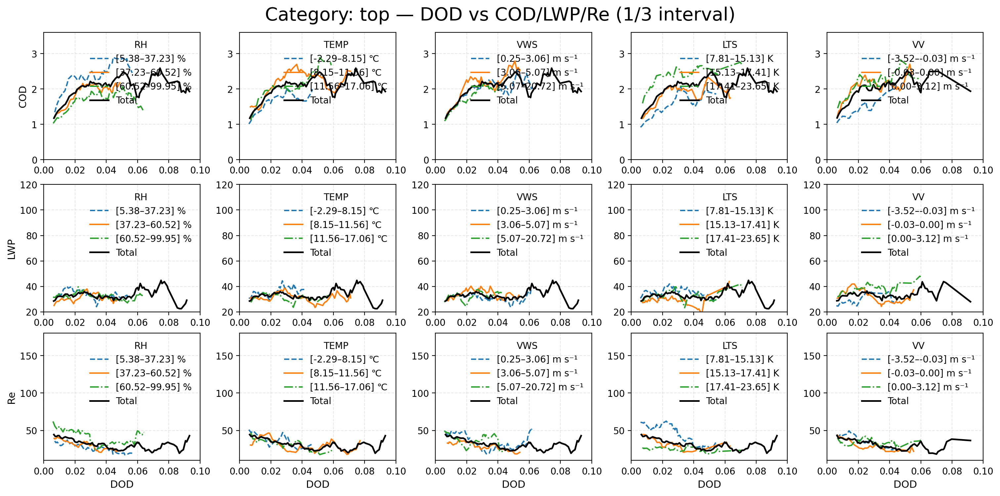

In [44]:
fig, axes = plot_category_panel(category_name='top', results=results)
plt.show()


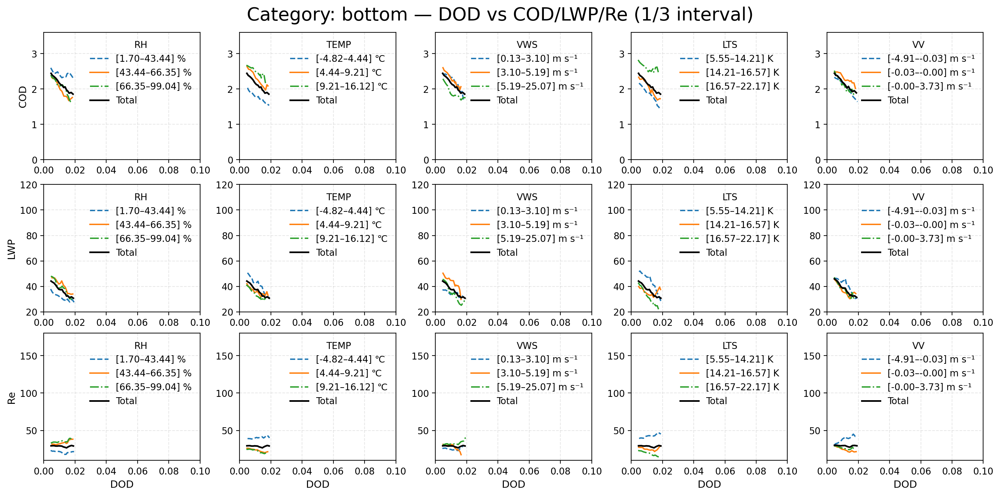

In [45]:
fig, axes = plot_category_panel(category_name='bottom', results=results)
plt.show()

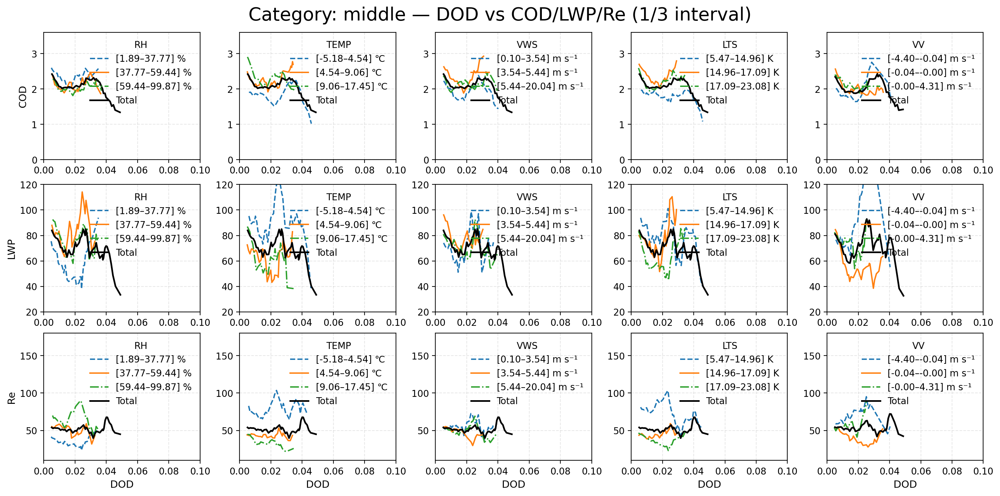

In [46]:
fig, axes = plot_category_panel(category_name='middle', results=results)
plt.show()

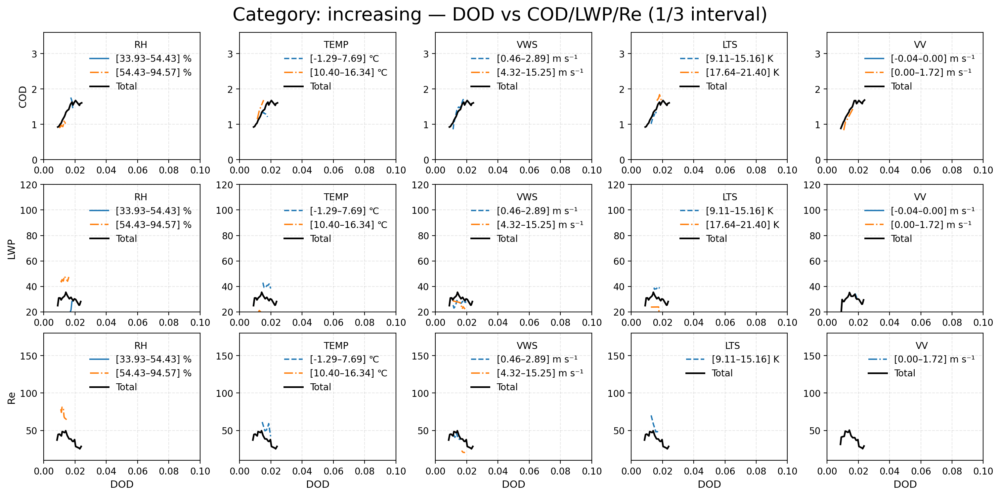

In [47]:
fig, axes = plot_category_panel(category_name='increasing', results=results)
plt.show()

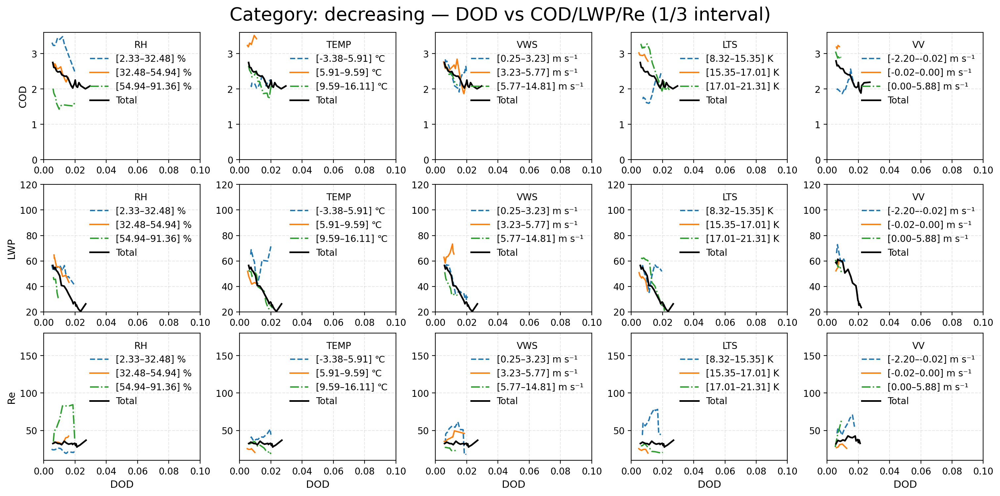

In [48]:
fig, axes = plot_category_panel(category_name='decreasing', results=results)
plt.show()

In [49]:
import numpy as np
import matplotlib.pyplot as plt

# ========= 通用：等频分箱平滑 =========
def _equal_frequency_xy(x, y, n_bins=100, q_clip=None, min_count_bin=8):
    """
    对 (x,y) 做等频分箱并返回平滑后的 x_mean, y_mean, y_sem, count
    - q_clip: 如 (0.05, 0.95) 会按 x 的分位数去极值；None 则不去极值
    - min_count_bin: 每个bin最少样本数，返回时会附带一个 mask 方便调用方过滤
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]

    if x.size == 0:
        out = {k: np.array([]) for k in ["x_mean","y_mean","y_sem","count","mask_valid"]}
        return out

    # x去极值（可选）
    if q_clip is not None:
        lo, hi = np.nanquantile(x, q_clip)
        m2 = (x >= lo) & (x <= hi)
        x, y = x[m2], y[m2]
        if x.size == 0:
            out = {k: np.array([]) for k in ["x_mean","y_mean","y_sem","count","mask_valid"]}
            return out

    order = np.argsort(x)
    x_sorted, y_sorted = x[order], y[order]
    n = x_sorted.size
    edges = np.linspace(0, n, n_bins + 1, dtype=int)

    x_mean = np.full(n_bins, np.nan)
    y_mean = np.full(n_bins, np.nan)
    y_sem  = np.full(n_bins, np.nan)
    count  = np.zeros(n_bins, dtype=int)

    for i in range(n_bins):
        s, e = edges[i], edges[i+1]
        if e - s < 1:
            continue
        xb, yb = x_sorted[s:e], y_sorted[s:e]
        x_mean[i] = np.nanmean(xb)
        y_mean[i] = np.nanmean(yb)
        count[i]  = xb.size
        if xb.size > 1:
            y_sem[i] = np.nanstd(yb, ddof=1) / np.sqrt(xb.size)

    mask_valid = count >= int(min_count_bin)
    return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count, "mask_valid": mask_valid}


# ========= 1) 数据处理函数：按“类别 + 控制量/目标量”生成平滑曲线 =========
def build_curves_for_category(
    category_name,
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=None,
    compute_re_if_missing=True,
    rho_l_g_cm3=1.0,  # 仅用于必要时计算 Re 的常数（不会影响对数斜率）
    n_bins=100, q_clip=(0.05, 0.95), min_count_bin=8
):
    """
    返回一个层次结构的 dict:
      curves[control_name][target_name] = {x_mean,y_mean,y_sem,count,mask_valid}
    其中 control ∈ [RH, TEMP, VWS, LTS, VV]，target ∈ [COD, LWP, Re]
    """
    # --- 收集本类别的原始数组 ---
    try:
        x_RH   = RH_by_cat[category_name]
        x_TEMP = TEMP_by_cat[category_name]
        x_VWS  = VWS_by_cat[category_name]
        x_LTS  = LTS_by_cat[category_name]
        x_VV   = VV_by_cat[category_name]
    except KeyError as e:
        raise KeyError(f"缺少控制量数据：{e}")

    try:
        y_COD = COD_by_cat[category_name]
        y_LWP = lwp_by_cat[category_name]
    except KeyError as e:
        raise KeyError(f"缺少目标量数据：{e}")

    # Re 处理：优先使用传入的 re_by_cat，否则按 LWP/COD 计算
    if (re_by_cat is not None) and (category_name in re_by_cat):
        y_Re = re_by_cat[category_name]
    elif compute_re_if_missing:
        # Re = (3/(2*rho_l)) * LWP / COD；常数对形状关系影响不大
        y_Re = (3.0 / (2.0 * rho_l_g_cm3)) * (np.asarray(y_LWP, float) / np.asarray(y_COD, float))
    else:
        y_Re = None  # 显式缺失

    controls = {
        "RH":   np.asarray(x_RH, float),
        "TEMP": np.asarray(x_TEMP, float),
        "VWS":  np.asarray(x_VWS, float),
        "LTS":  np.asarray(x_LTS, float),
        "VV":   np.asarray(x_VV, float),
    }
    targets = {
        "COD": np.asarray(y_COD, float),
        "LWP": np.asarray(y_LWP, float),
    }
    if y_Re is not None:
        targets["Re"] = np.asarray(y_Re, float)

    curves = {}
    for cname, x in controls.items():
        curves[cname] = {}
        for tname, y in targets.items():
            res = _equal_frequency_xy(x, y, n_bins=n_bins, q_clip=q_clip, min_count_bin=min_count_bin)
            curves[cname][tname] = res
    return curves

In [50]:
def plot_category_panel(
    category_name,
    curves,
    controls_order=("RH","TEMP","VWS","LTS","VV"),
    targets_order=("COD","LWP","Re"),
    figsize=(15, 7),
    suptitle=None,
    fixed_ylim={"COD": (0, 4), "LWP": (15, 170), "Re": (0,500)},
    show_sem=False,
    scatter=None
):
    """
    绘制面板：仅保留每行第一个 ylabel、每列最后一行的 xlabel；
    并为每列单独设置 xlim。
    """
    targets_available = [t for t in targets_order if t in (curves.get(controls_order[0], {})).keys()]
    n_rows = len(targets_available)
    n_cols = len(controls_order)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, dpi=220, constrained_layout=True)
    if n_rows == 1:
        axes = np.array([axes])

    unit_map = {"RH": "%", "TEMP": "℃", "VWS": "m s⁻¹", "LTS": "K", "VV": "m s⁻¹"}
    y_label_map = {"COD": "COD", "LWP": "LWP (g m⁻²)", "Re": "Re (μm)"}

    # === 每列自定义 x 轴范围 ===
    xlim_map = {
        "RH":   (0, 80),
        "TEMP": (-2, 15),
        "VWS":  (0, 10),
        "LTS":  (10, 20),
        "VV":   (-0.2, 0.8)
    }

    for ci, cname in enumerate(controls_order):
        if cname not in curves:
            for ri in range(n_rows):
                axes[ri, ci].set_visible(False)
            continue

        for ri, tname in enumerate(targets_available):
            ax = axes[ri, ci]
            res = curves[cname][tname]
            x, y = res["x_mean"], res["y_mean"]
            m = res["mask_valid"]

            ax.plot(x[m], y[m], lw=1.8, label=f"{tname} vs {cname}")

            if show_sem and np.any(m) and np.isfinite(res["y_sem"][m]).any():
                ylo, yhi = y[m] - res["y_sem"][m], y[m] + res["y_sem"][m]
                ax.fill_between(x[m], ylo, yhi, alpha=0.18, linewidth=0)

            ax.grid(ls="--", alpha=0.3)

            # === 仅最左列显示 ylabel ===
            if ci == 0:
                ax.set_ylabel(y_label_map.get(tname, tname))
            else:
                ax.set_ylabel("")

            # === 仅最后一行显示 xlabel ===
            if ri == n_rows - 1:
                ax.set_xlabel(f"{cname} ({unit_map.get(cname, '')})")
            else:
                ax.set_xlabel("")

            # === 固定 y 轴范围 ===
            if fixed_ylim.get(tname) is not None:
                ax.set_ylim(*fixed_ylim[tname])

            # === 设置该列 x 轴范围 ===
            if cname in xlim_map:
                ax.set_xlim(*xlim_map[cname])

    if suptitle is None:
        suptitle = f"Category: {category_name} — COD/LWP/Re vs Meteorological variables"
    fig.suptitle(suptitle, fontsize=15)

    return fig, axes


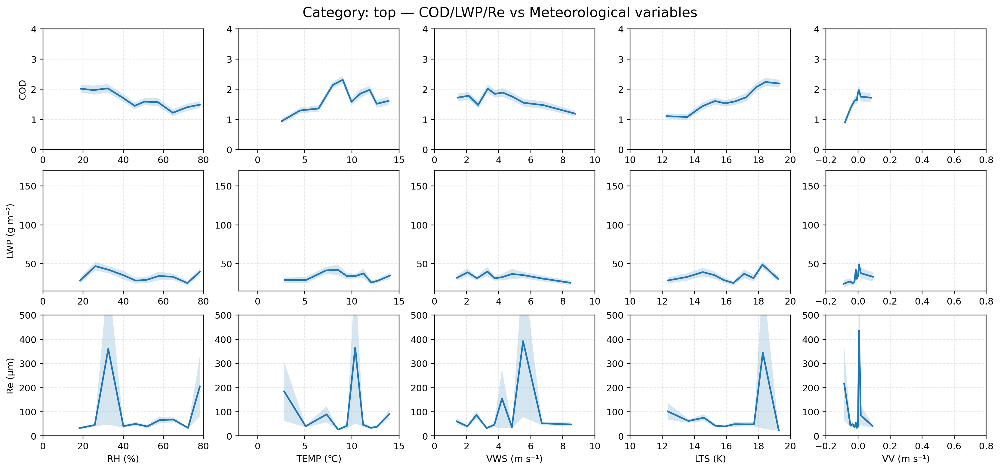

In [51]:
curves_top = build_curves_for_category(
    "top",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("top", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

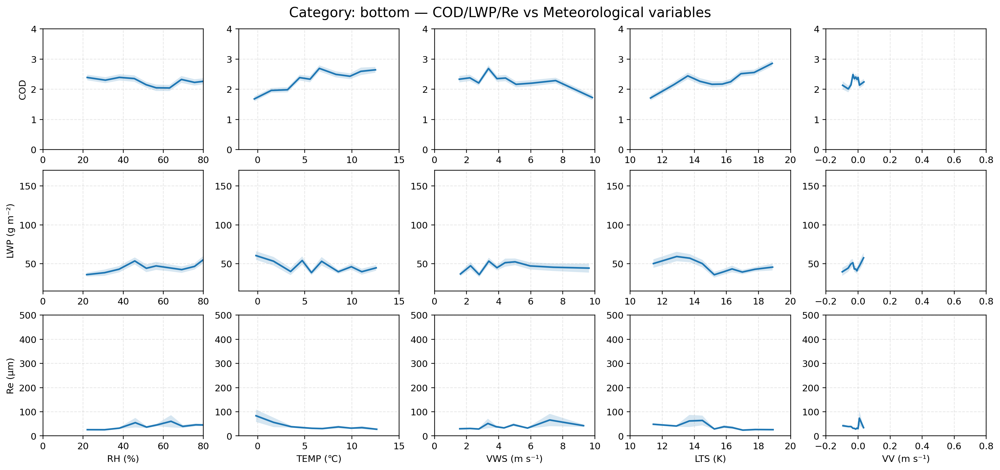

In [52]:
curves_top = build_curves_for_category(
    "bottom",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("bottom", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

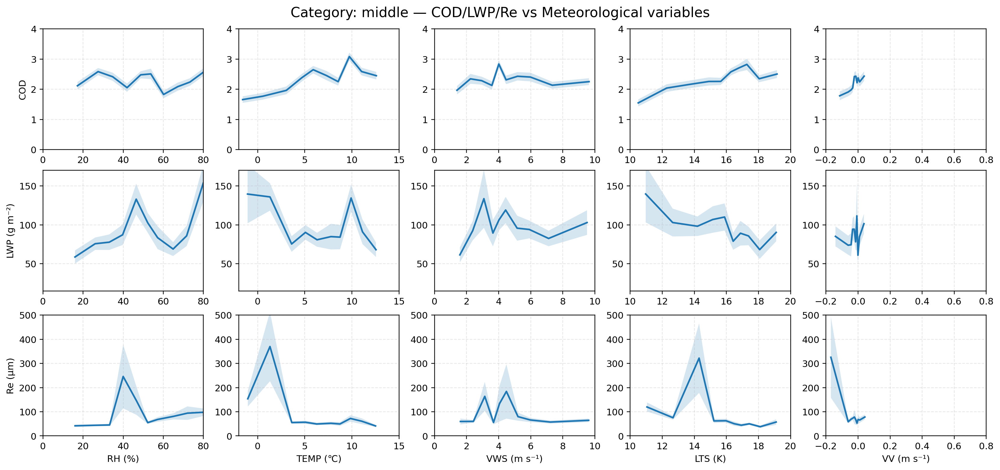

In [53]:
curves_top = build_curves_for_category(
    "middle",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("middle", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

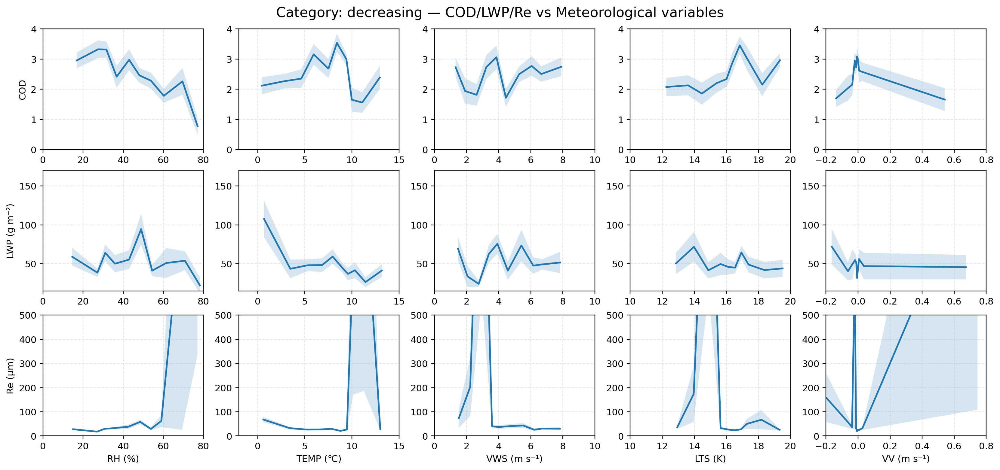

In [54]:
curves_top = build_curves_for_category(
    "decreasing",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("decreasing", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

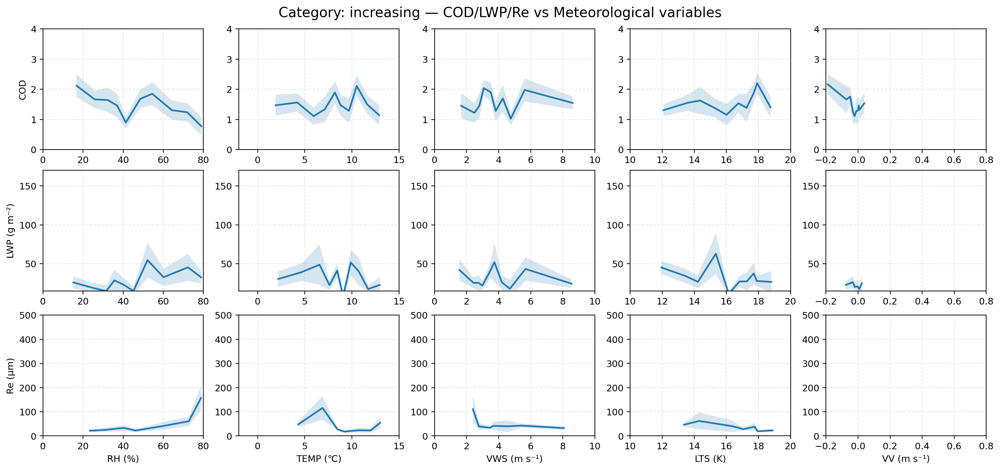

In [55]:
curves_top = build_curves_for_category(
    "increasing",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("increasing", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()